<a href="https://colab.research.google.com/github/Xxxxxxiii/synthetic_data_GAN/blob/main/code/CTGAN_try.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install sdv ctgan sdmetrics scikit-learn numpy pandas openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.3/193.3 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.3/198.3 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 75.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.3/74.3 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 61.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 6.7 MB/s eta 0:00:00


In [2]:
!git --version

git version 2.34.1


In [3]:
!git config --global user.email "liuzx040923@gmail.com"
!git config --global user.name "lzx"

In [6]:
!git clone https://github.com/Xxxxxxiii/synthetic_data_GAN synthetic_data_GAN

Cloning into 'synthetic_data_GAN'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 6 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (6/6), 715.46 KiB | 22.36 MiB/s, done.


In [10]:
%cd synthetic_data_GAN

/content/synthetic_data_GAN


In [11]:
!git status

On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean


In [9]:
import pandas as pd
real_data = pd.read_excel("cooling_tower_modeling_df.xlsx")
# synthetic_data = pd.read_excel("synthetic_data_cooler.xlsx")

In [ ]:
real_data = real_data.drop(columns = ['time'])

In [ ]:
print("数据集信息:")
print(f"形状: {real_data.shape}")
print(f"列名: {real_data.columns.tolist()}")
print(f"数据类型:\n{real_data.dtypes}")
print(f"前5行数据:\n{real_data.head()}")

数据集信息:
形状: (128122, 8)
列名: ['temp_in', 'temp_out', 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'flow_cow', 'temp_dry_bulb', 'ratio_humidity']
数据类型:
temp_in           float64
temp_out          float64
freq_fan_1        float64
freq_fan_2        float64
freq_fan_3        float64
flow_cow          float64
temp_dry_bulb     float64
ratio_humidity    float64
dtype: object
前5行数据:
   temp_in  temp_out  freq_fan_1  freq_fan_2  freq_fan_3  flow_cow  \
0    29.39     26.33       29.83       30.00       29.78    759.20   
1    29.37     26.34       29.82       29.93       29.80    758.12   
2    29.36     26.34       29.84       30.00       29.80    760.00   
3    29.37     26.33       29.78       29.94       29.78    759.15   
4    29.37     26.34       29.78       30.00       29.78    758.92   

   temp_dry_bulb  ratio_humidity  
0          23.63           77.82  
1          23.63           77.82  
2          23.62           77.91  
3          23.56           77.99  
4          23.55           78

In [ ]:
from ctgan import CTGAN
import pickle

discrete_columns = []
ctgan = CTGAN(epochs=25)
ctgan.fit(real_data, discrete_columns)

# 保存模型
with open('ctgan_cooler_model.pkl', 'wb') as f:
    pickle.dump(ctgan, f)

print("模型保存成功！")

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at /pytorch/aten/src/ATen/cuda/CublasHandlePool.cpp:179.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


模型保存成功！


In [ ]:
# 在Colab中重新保存模型，使用兼容性更好的方法
import pickle
import torch

ctgan.save('ctgan_model.pt')

In [ ]:
import pickle
import torch
with open('ctgan_cooler_model.pkl', 'rb') as f:
    loaded_ctgan = pickle.load(f)

In [ ]:
# Create synthetic data
synthetic_data = loaded_ctgan.sample(50000)

In [ ]:
synthetic_data.to_excel('synthetic_data_cooler.xlsx', index=False)

In [ ]:
print(len(real_data))

128122


In [ ]:
print(synthetic_data.head())

     temp_in   temp_out  freq_fan_1  freq_fan_2  freq_fan_3     flow_cow  \
0  32.247559  27.874686   49.257644   49.729652   49.496480  1185.105756   
1  34.751379  30.985842   49.242000   49.656663   49.436430   708.222176   
2  33.324020  30.643286   49.151555   49.650140   49.417891   758.641092   
3  31.865772  28.964256   49.217156   49.703573   49.467051  1252.306936   
4  35.201950  29.414342   49.245645   49.696053   49.478636   631.129742   

   temp_dry_bulb  ratio_humidity  
0      31.632320       69.744502  
1      34.963387       51.008518  
2      36.124419       53.344556  
3      38.216221       46.621110  
4      28.072144       76.697326  


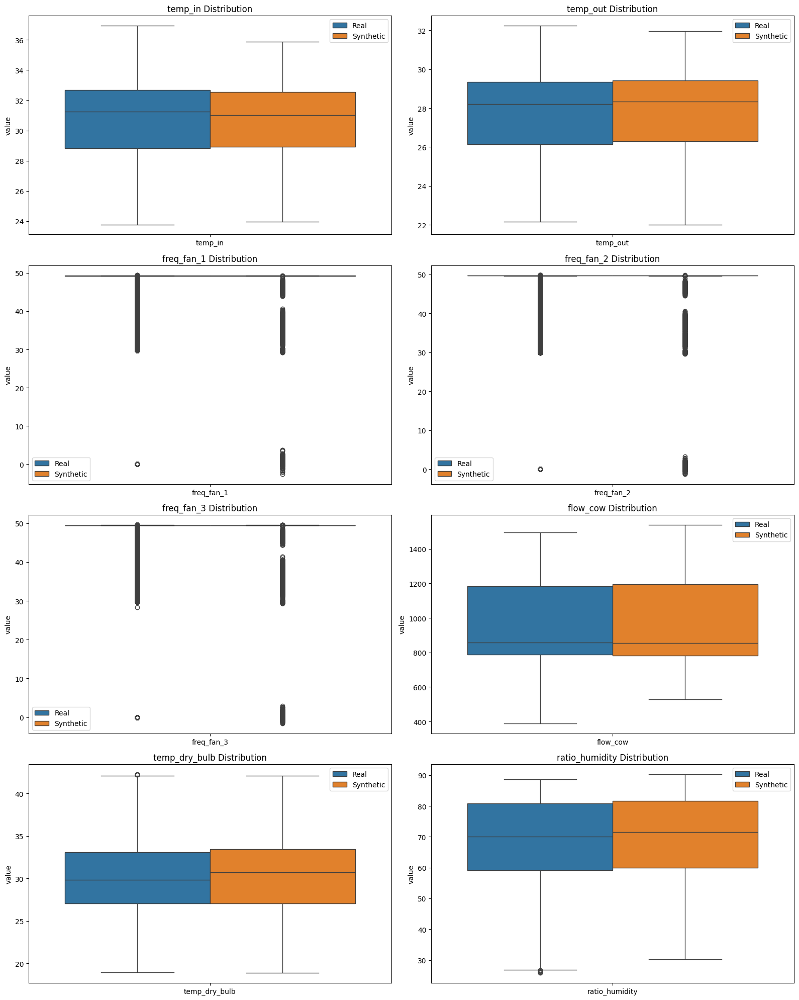

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_side_by_side_boxplots(real_data, synthetic_data, discrete_columns):
    """为每个变量绘制并排箱线图"""

    numerical_columns = [col for col in real_data.columns if col not in discrete_columns]

    n_cols = 2
    n_rows = (len(numerical_columns) + 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))

    if n_rows == 1:
        axes = [axes] if n_cols == 1 else axes
    else:
        axes = axes.flatten()

    for i, column in enumerate(numerical_columns):
        if i < len(axes):
            # 使用seaborn绘制并排箱线图
            plot_data = pd.DataFrame({
                'value': pd.concat([real_data[column], synthetic_data[column]]),
                'type': ['Real'] * len(real_data) + ['Synthetic'] * len(synthetic_data),
                'variable': [column] * (len(real_data) + len(synthetic_data))
            })

            sns.boxplot(data=plot_data, x='variable', y='value', hue='type', ax=axes[i])
            axes[i].set_title(f'{column} Distribution', fontsize=12)
            axes[i].set_xlabel('')
            axes[i].legend()

    # 隐藏多余的子图
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

# 使用示例
plot_side_by_side_boxplots(real_data, synthetic_data, discrete_columns)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_frequency_grid(data, col1, col2):
    """
    Generates grid plots (heatmap and 2D histogram with counts) for the frequency
    distribution of two specified columns in a DataFrame.

    Args:
        data (pd.DataFrame): The input DataFrame.
        col1 (str): The name of the column for the x-axis.
        col2 (str): The name of the column for the y-axis.
    """
    # Determine appropriate bins (1-degree intervals)
    col1_min, col1_max = data[col1].min(), data[col1].max()
    col2_min, col2_max = data[col2].min(), data[col2].max()

    col1_bins = np.arange(np.floor(col1_min), np.ceil(col1_max) + 1, 1)
    col2_bins = np.arange(np.floor(col2_min), np.ceil(col2_max) + 1, 1)

    # Create a figure with two subplots
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Plot 1: Heatmap
    sns.histplot(x=data[col1], y=data[col2], bins=50, cmap="viridis", ax=axes[0])
    axes[0].set_title(f'Frequency of {col1} vs {col2} (Heatmap)')
    axes[0].set_xlabel(col1)
    axes[0].set_ylabel(col2)

    # Plot 2: 2D Histogram with counts
    hist, xedges, yedges = np.histogram2d(
        data[col1],
        data[col2],
        bins=[col1_bins, col2_bins]
    )

    # Create the heatmap with the calculated histogram data
    sns.heatmap(hist.T, cmap="viridis", annot=True, fmt='g', ax=axes[1],
                xticklabels=[f'{int(xedges[i])}-{int(xedges[i+1])}' for i in range(len(xedges)-1)],
                yticklabels=[f'{int(yedges[i])}-{int(yedges[i+1])}' for i in range(len(yedges)-1)])

    axes[1].set_title(f'Frequency of {col1} vs {col2} (1-degree intervals)')
    axes[1].set_xlabel(f'{col1} Interval (°C)')
    axes[1].set_ylabel(f'{col2} Interval (°C)')
    axes[1].invert_yaxis() # Invert y-axis to match histogram orientation


    plt.tight_layout()
    plt.show()

# Example usage (optional - can be run in a separate cell)
# plot_frequency_grid(real_data, 'temp_in', 'temp_out')
# plot_frequency_grid(synthetic_data, 'temp_in', 'temp_out')

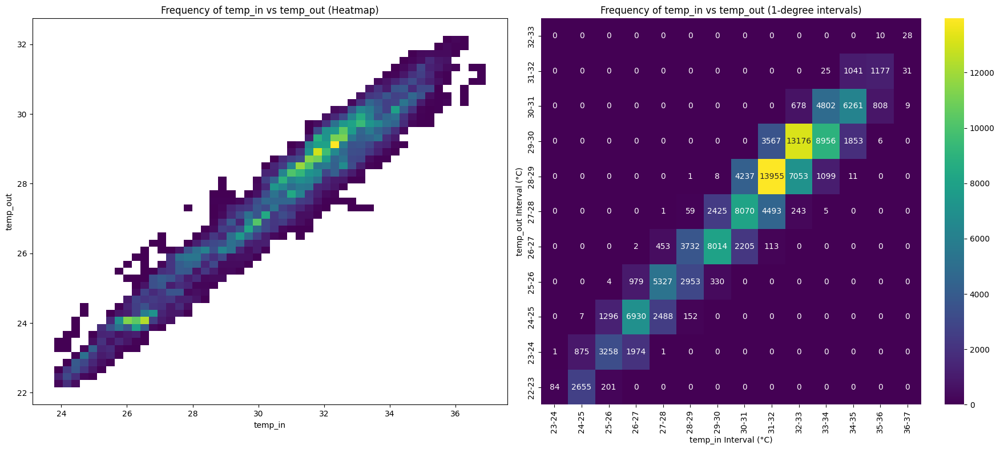

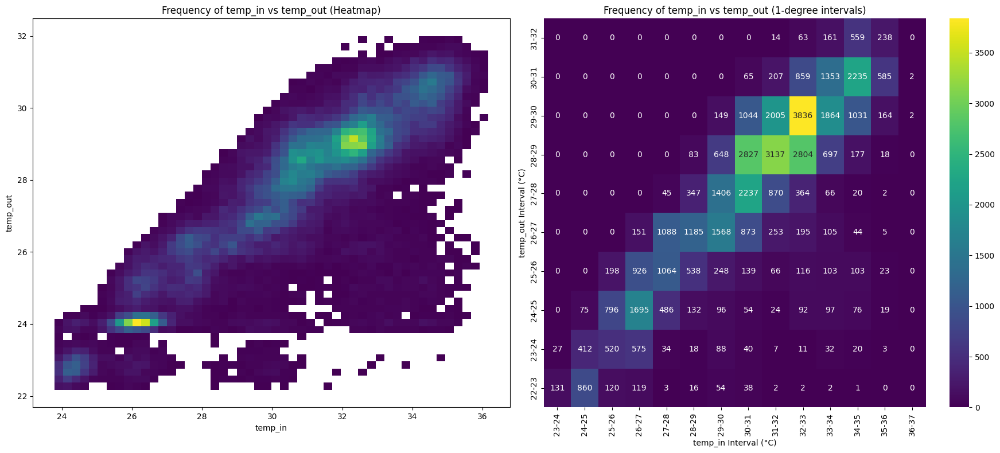

In [ ]:
plot_frequency_grid(real_data, 'temp_in', 'temp_out')
# plot_frequency_grid(synthetic_data, 'temp_in', 'temp_out')
plot_frequency_grid(filtered_data, 'temp_in', 'temp_out')

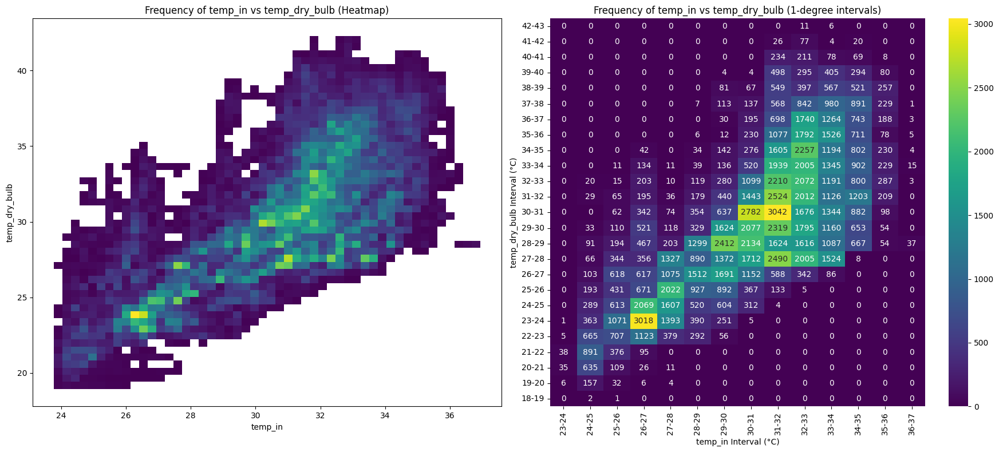

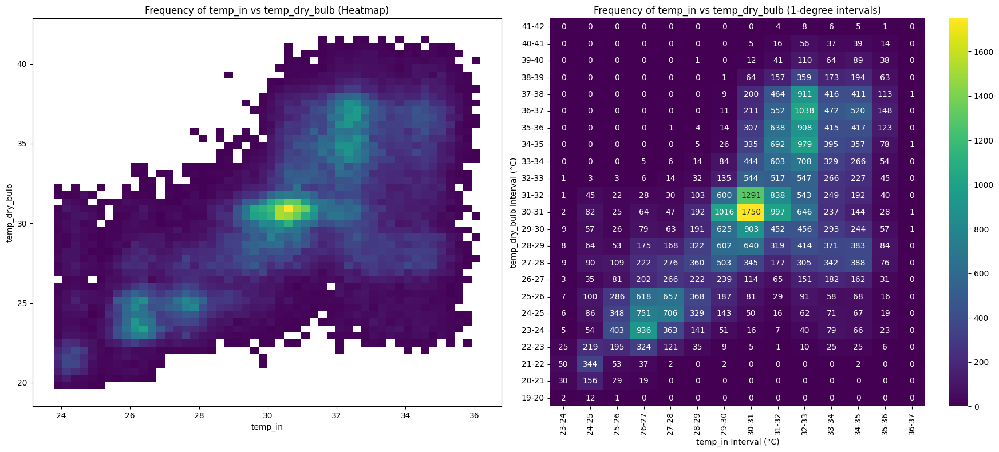

In [ ]:
plot_frequency_grid(real_data, 'temp_in', 'temp_dry_bulb')
plot_frequency_grid(filtered_data, 'temp_in', 'temp_dry_bulb')


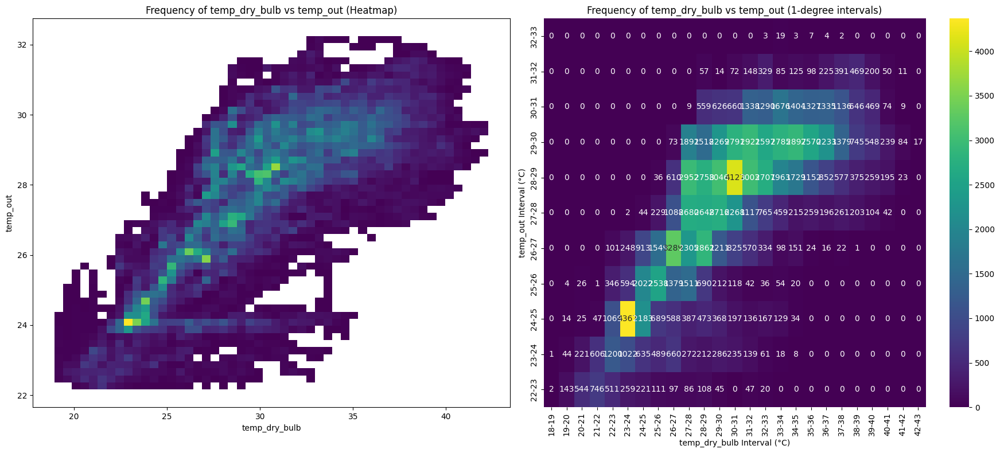

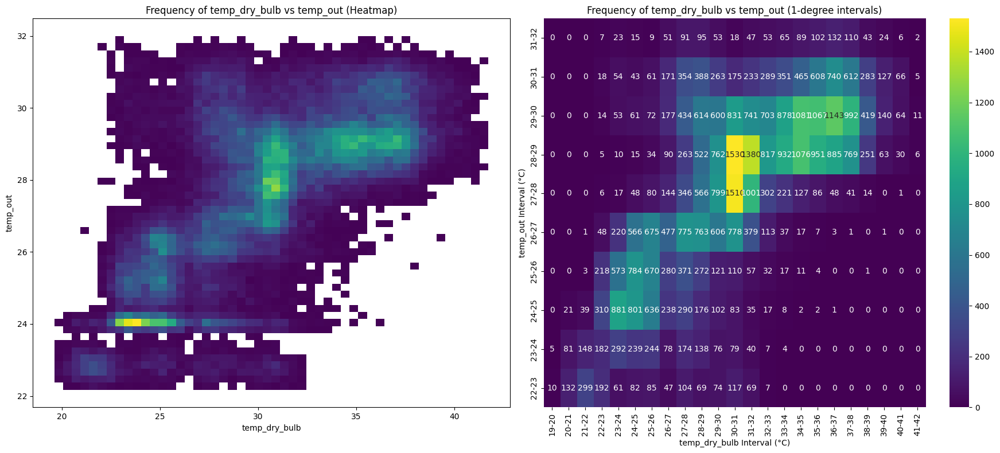

In [ ]:
plot_frequency_grid(real_data, 'temp_dry_bulb', 'temp_out')
plot_frequency_grid(filtered_data, 'temp_dry_bulb', 'temp_out')

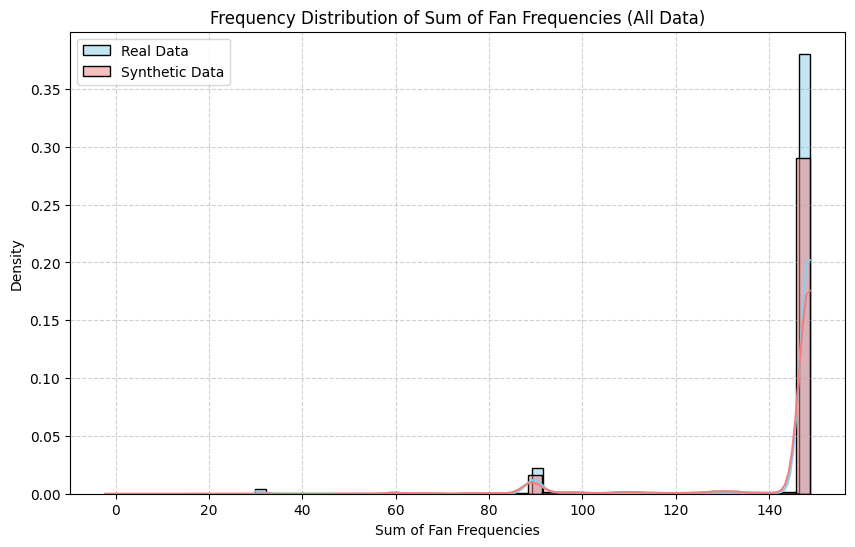

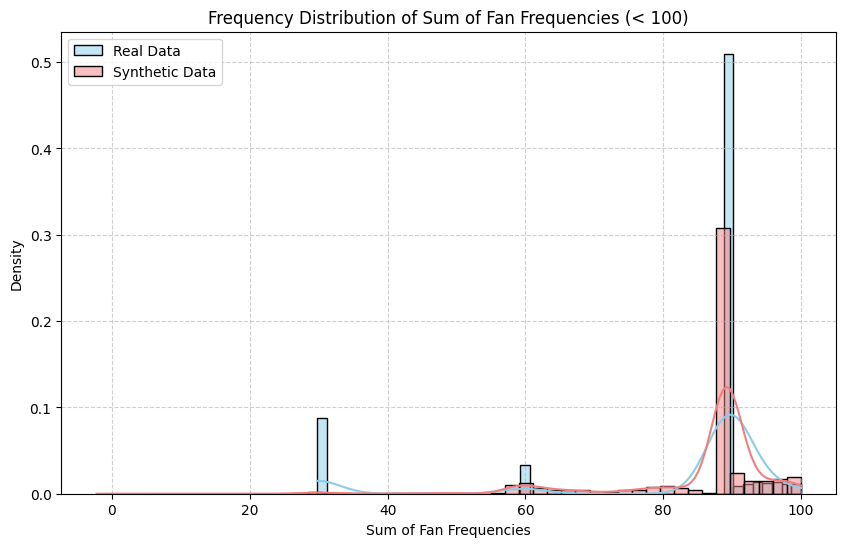

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Calculate the sum of fan frequencies for both real and synthetic data
real_data['freq_fan_sum'] = real_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)
synthetic_data['freq_fan_sum'] = synthetic_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)

# Plot the frequency distribution histogram for all data
plt.figure(figsize=(10, 6))
sns.histplot(real_data['freq_fan_sum'], bins=50, color='skyblue', label='Real Data', kde=True, stat='density', common_norm=False)
sns.histplot(synthetic_data['freq_fan_sum'], bins=50, color='lightcoral', label='Synthetic Data', kde=True, stat='density', common_norm=False)

plt.title('Frequency Distribution of Sum of Fan Frequencies (All Data)')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Determine a threshold to exclude the tail (e.g., based on visual inspection or percentile)
# Let's choose a threshold around the visually observed peak before the tail, e.g., 100
threshold = 100

# Plot the frequency distribution histogram excluding the tail
plt.figure(figsize=(10, 6))
sns.histplot(real_data[real_data['freq_fan_sum'] < threshold]['freq_fan_sum'], bins=50, color='skyblue', label='Real Data', kde=True, stat='density', common_norm=False)
sns.histplot(synthetic_data[synthetic_data['freq_fan_sum'] < threshold]['freq_fan_sum'], bins=50, color='lightcoral', label='Synthetic Data', kde=True, stat='density', common_norm=False)

plt.title(f'Frequency Distribution of Sum of Fan Frequencies (< {threshold})')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [ ]:
import numpy as np

def wet_bulb_stull(temp_dry_c: float, rh_percent: float) -> float:
    """
    Approximate wet-bulb temperature using Stull's formula.

    Args:
        temp_dry_c: Dry-bulb temperature in Celsius
        rh_percent: Relative humidity in percentage (0-100)

    Returns:
        Wet-bulb temperature in Celsius
    """
    rh = max(1.0, min(float(rh_percent), 99.0))
    T = float(temp_dry_c)
    Tw = (
        T * np.arctan(0.151977 * (rh + 8.313659) ** 0.5)
        + np.arctan(T + rh)
        - np.arctan(rh - 1.676331)
        + 0.00391838 * rh ** 1.5 * np.arctan(0.023101 * rh)
        - 4.686035
    )
    return float(Tw)

print("wet_bulb_stull 函数已定义。")

wet_bulb_stull 函数已定义。


In [ ]:
import plotly.express as px
import pandas as pd

def plot_3d_frequency_colored(data, freq1_col, freq2_col, freq3_col, color_col):
    """
    Generates an interactive 3D scatter plot with three frequency columns as axes,
    colored by the values of another specified column using Plotly.

    Args:
        data (pd.DataFrame): The input DataFrame.
        freq1_col (str): The name of the first frequency column (x-axis).
        freq2_col (str): The name of the second frequency column (y-axis).
        freq3_col (str): The name of the third frequency column (z-axis).
        color_col (str): The name of the column to use for coloring the points.
    """
    if color_col not in data.columns:
        print(f"Error: Color column '{color_col}' not found in the DataFrame.")
        return

    if not all(col in data.columns for col in [freq1_col, freq2_col, freq3_col]):
        print("Error: One or more frequency columns not found in the DataFrame.")
        return

    fig = px.scatter_3d(
        data,
        x=freq1_col,
        y=freq2_col,
        z=freq3_col,
        color=color_col,
        title=f'3D Frequency Distribution colored by {color_col}',
        labels={
            freq1_col: freq1_col,
            freq2_col: freq2_col,
            freq3_col: freq3_col,
            color_col: color_col
        }
    )

    fig.show()


In [ ]:
plot_3d_frequency_colored(real_data, 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'temp_out')
plot_3d_frequency_colored(synthetic_data, 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'temp_out')

In [ ]:
plot_3d_frequency_colored(real_data, 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'flow_cow')
plot_3d_frequency_colored(synthetic_data, 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'flow_cow')

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import zscore

# 1. 物理约束检查函数
def check_physics_constraints(row):
    """
    检查单行数据是否满足冷却塔物理约束。
    """
    # 假设温度单位是摄氏度
    temp_dry_c = row.get("temp_dry_bulb", np.nan)
    rh_percent = row.get("ratio_humidity", np.nan)
    temp_in = row.get("temp_in", np.nan)
    temp_out = row.get("temp_out", np.nan)
    freq_fan_1 = row.get("freq_fan_1", np.nan)
    freq_fan_2 = row.get("freq_fan_2", np.nan)
    freq_fan_3 = row.get("freq_fan_3", np.nan)
    flow_cow = row.get("flow_cow", np.nan)

    # 检查是否有NaN值
    if pd.isna([temp_dry_c, rh_percent, temp_in, temp_out, freq_fan_1, freq_fan_2, freq_fan_3, flow_cow]).any():
        return False, np.nan, False, False, False # 如果有NaN，认为不通过约束

    # 湿度比处理 (接受 0-1 或 0-100)
    if rh_percent <= 1.5:
        rh_percent *= 100.0

    # 计算湿球温度 (使用Stull's formula，需要确保函数可用或在此定义)
    # 这里我们假设 wet_bulb_stull 函数已在 notebook 中定义
    try:
        Tw = wet_bulb_stull(temp_dry_c, rh_percent)
    except NameError:
        print("警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。")
        Tw = np.nan # 如果函数未定义，湿球温度为NaN

    # 物理约束条件
    # 1. 出水温度 <= 进水温度 (冷却效果)
    temp_constraint = bool(temp_out <= temp_in + 1e-6) # 允许微小误差

    # 2. 出水温度 >= 湿球温度 (理论下限)
    wetbulb_constraint = bool(temp_out >= Tw - 0.5) if not np.isnan(Tw) else True # 如果无法计算湿球温度，此约束默认为True

    # 3. 频率和流量非负
    nonnegative_constraint = bool(
        (freq_fan_1 >= 0) and
        (freq_fan_2 >= 0) and
        (freq_fan_3 >= 0) and
        (flow_cow >= 0)
    )

    all_pass = temp_constraint and wetbulb_constraint and nonnegative_constraint
    return all_pass, Tw, temp_constraint, wetbulb_constraint, nonnegative_constraint

# 2. 数据分布相似性评分函数
def compute_distribution_score(real_data_subset, synthetic_data_subset):
    """
    基于 Z-score 距离计算样本的在分布内的分数。
    """
    # 确保数据是数值类型且没有NaN
    real_data_subset = real_data_subset.select_dtypes(include=np.number).dropna()
    synthetic_data_subset = synthetic_data_subset.select_dtypes(include=np.number).dropna()

    if real_data_subset.empty or synthetic_data_subset.empty:
        print("警告: 计算分布分数的数据中包含 NaN 或为空。")
        return np.zeros(len(synthetic_data_subset)) # 返回0分

    # Ensure columns match and are in the same order
    common_cols = list(real_data_subset.columns.intersection(synthetic_data_subset.columns))
    real_data_subset = real_data_subset[common_cols]
    synthetic_data_subset = synthetic_data_subset[common_cols]


    mu = real_data_subset.mean().values
    sigma = real_data_subset.std(ddof=1).replace(0, 1e-6).values # 避免除以零

    X = synthetic_data_subset.values
    z_scores = (X - mu) / sigma
    distances = np.sqrt((z_scores ** 2).sum(axis=1))
    scores = 1.0 / (1.0 + distances) # 距离越小，分数越高

    # 归一化到 0-1 范围
    score_min, score_max = scores.min(), scores.max()
    if score_max == score_min:
         normalized_scores = np.zeros_like(scores) # 如果所有分数相同，归一化为0
    else:
        normalized_scores = (scores - score_min) / (score_max - score_min)

    return normalized_scores

# 3. 数值范围惩罚函数
def compute_range_penalty(real_data_subset, synthetic_data_subset):
    """
    计算超出真实数据范围的惩罚。
    """
    # 确保数据是数值类型
    real_data_subset = real_data_subset.select_dtypes(include=np.number)
    synthetic_data_subset = synthetic_data_subset.select_dtypes(include=np.number)

    if real_data_subset.empty or synthetic_data_subset.empty:
        print("警告: 计算范围惩罚的数据中包含 NaN 或为空。")
        return np.zeros(len(synthetic_data_subset)), np.zeros(len(synthetic_data_subset), dtype=bool)

    # Ensure columns match and are in the same order
    common_cols = list(real_data_subset.columns.intersection(synthetic_data_subset.columns))
    real_data_subset = real_data_subset[common_cols]
    synthetic_data_subset = synthetic_data_subset[common_cols]


    min_vals = real_data_subset.min()
    max_vals = real_data_subset.max()

    penalties = []
    flags = []

    for _, row in synthetic_data_subset.iterrows():
        violations = 0
        out_of_range = False

        for col in real_data_subset.columns:
             # 检查是否超出范围，允许微小误差
            if (row[col] < min_vals[col] - 1e-9) or (row[col] > max_vals[col] + 1e-9):
                violations += 1
                out_of_range = True

        penalties.append(violations)
        flags.append(out_of_range)

    # 惩罚分数，超出范围越多，分数越低 (例如，每多一个违规扣0.2分，最低0分)
    penalty_scores = np.clip(1.0 - 0.2 * np.array(penalties), 0.0, 1.0)
    return penalty_scores, np.array(flags, dtype=bool)

# 示例使用：计算 synthetic_data 的可信度指标
print("正在计算生成样本的可信度指标...")

# 应用物理约束检查
physics_results = synthetic_data.apply(check_physics_constraints, axis=1, result_type="expand")
synthetic_data['constraints_pass'] = physics_results[0].astype(bool)
# synthetic_data['wetbulb_C'] = physics_results[1].astype(float) # 如果wet_bulb_stull可用
synthetic_data['c1_temp_out_le_temp_in'] = physics_results[2].astype(bool)
synthetic_data['c2_temp_out_ge_wetbulb'] = physics_results[3].astype(bool)
synthetic_data['c3_nonnegative'] = physics_results[4].astype(bool)

# 定义用于分布和范围检查的数值列，排除新添加的布尔列
numerical_cols_for_metrics = real_data.select_dtypes(include=np.number).columns.tolist()

# 应用数值范围惩罚
synthetic_data['range_penalty'], synthetic_data['any_out_of_range'] = compute_range_penalty(
    real_data[numerical_cols_for_metrics], # 使用真实数据的数值列子集确定范围
    synthetic_data[numerical_cols_for_metrics] # 对合成数据的数值列子集进行检查
)

# 过滤掉不符合物理约束和范围约束的数据
filtered_data = synthetic_data[synthetic_data['constraints_pass'] & ~synthetic_data['any_out_of_range']].copy()

# 对过滤后的数据应用数据分布相似性评分
if not filtered_data.empty:
    filtered_data['credibility_score'] = compute_distribution_score(
        real_data[numerical_cols_for_metrics], # 使用真实数据的数值列子集计算均值和标准差
        filtered_data[numerical_cols_for_metrics] # 对过滤后的数据进行评分
    )
else:
    print("警告: 过滤后没有数据，无法计算可信度分数。")


print("可信度指标计算完成。")

# 显示包含可信度指标的过滤后合成数据的前几行
print("\n包含可信度指标的过滤后合成数据 (前5行):")
display(filtered_data.head())

# 显示一些汇总统计信息
print("\n过滤后可信度指标汇总统计:")
if not filtered_data.empty:
    print(f"  过滤后样本数: {len(filtered_data)}")
    print(f"  平均可信度分数: {filtered_data['credibility_score'].mean():.4f}")
    print(f"  物理约束通过率 (过滤后应为1.0): {filtered_data['constraints_pass'].mean():.4f}")
    print(f"  平均分布分数: {filtered_data['credibility_score'].mean():.4f}") # 过滤后的可信度分数就是分布分数
    print(f"  超出范围率 (过滤后应为0.0): {filtered_data['any_out_of_range'].mean():.4f}")
else:
     print("  过滤后没有数据，无法显示统计信息。")

流式输出内容被截断，只能显示最后 5000 行内容。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet_bulb_stull 函数未定义，物理约束检查将跳过湿球温度部分。
警告: wet

,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,constraints_pass,c1_temp_out_le_temp_in,c2_temp_out_ge_wetbulb,c3_nonnegative,range_penalty,any_out_of_range,credibility_score
0,24.159630,22.475578,29.729381,29.741877,29.629718,785.256388,22.092649,65.750061,True,True,True,True,1.0,False,0.096348
1,27.778462,24.063829,49.288494,49.708010,49.518389,855.949268,26.537841,83.671198,True,True,True,True,1.0,False,0.351633
2,26.592480,23.939416,49.229761,49.677021,49.463729,850.995451,27.780481,85.708796,True,True,True,True,1.0,False,0.318661
3,35.362514,30.509369,49.193473,49.676541,49.496779,649.061017,30.391756,84.779560,True,True,True,True,1.0,False,0.311273
4,31.810396,26.162999,49.244354,49.718766,49.484342,889.583690,28.221989,62.298780,True,True,True,True,1.0,False,0.642168



过滤后可信度指标汇总统计:
  过滤后样本数: 47952
  平均可信度分数: 0.4224
  物理约束通过率 (过滤后应为1.0): 1.0000
  平均分布分数: 0.4224
  超出范围率 (过滤后应为0.0): 0.0000


### 评估相似性分数

这样的评估方式是否合理有待商榷。

In [ ]:
print(synthetic_data.columns)

Index(['temp_in', 'temp_out', 'freq_fan_1', 'freq_fan_2', 'freq_fan_3',
       'flow_cow', 'temp_dry_bulb', 'ratio_humidity', 'constraints_pass',
       'c1_temp_out_le_temp_in', 'c2_temp_out_ge_wetbulb', 'c3_nonnegative',
       'in_distribution_score', 'range_penalty', 'any_out_of_range',
       'credibility_score'],
      dtype='object')


In [ ]:
# Save the filtered data to an Excel file
output_filename = "filtered_synthetic_data_with_credibility.xlsx"
filtered_data.to_excel(output_filename, index=False)
print(f"Filtered synthetic data saved to {output_filename}")

# Define the credibility score thresholds
thresholds = [0.6, 0.7, 0.8, 0.9]

# Count the number of rows above each threshold
print("\nNumber of rows with credibility score above threshold:")
for threshold in thresholds:
    count = len(filtered_data[filtered_data['credibility_score'] > threshold])
    print(f"  > {threshold}: {count}")

Filtered synthetic data saved to filtered_synthetic_data_with_credibility.xlsx

Number of rows with credibility score above threshold:
  > 0.6: 7418
  > 0.7: 4259
  > 0.8: 1835
  > 0.9: 250


In [ ]:
# 根据不同阈值过滤数据
synthetic_data_credibility_score_05 = filtered_data[filtered_data['credibility_score'] > 0.5].copy()
synthetic_data_credibility_score_06 = filtered_data[filtered_data['credibility_score'] > 0.6].copy()
synthetic_data_credibility_score_07 = filtered_data[filtered_data['credibility_score'] > 0.7].copy()
synthetic_data_credibility_score_08 = filtered_data[filtered_data['credibility_score'] > 0.8].copy()
synthetic_data_credibility_score_09 = filtered_data[filtered_data['credibility_score'] > 0.9].copy()

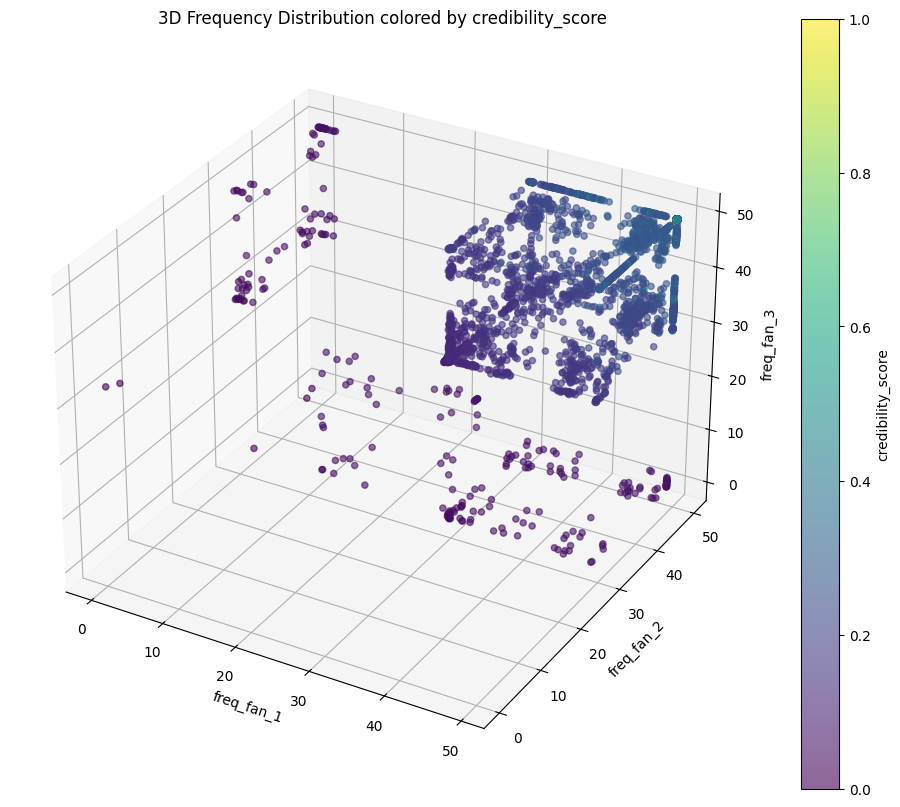

In [ ]:
# 满足物理约束的过滤后数据filtered_data
plot_3d_frequency_colored(filtered_data, 'freq_fan_1', 'freq_fan_2', 'freq_fan_3', 'credibility_score')

### 评估新颖性分数


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


已为 filtered_data 添加基于 K 近邻和 LOF 的新颖性评分。

包含新颖性评分的 filtered_data (前5行):


,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,constraints_pass,c1_temp_out_le_temp_in,c2_temp_out_ge_wetbulb,c3_nonnegative,in_distribution_score,range_penalty,any_out_of_range,credibility_score,novelty_score_knn,novelty_score_lof
0,24.159630,22.475578,29.729381,29.741877,29.629718,785.256388,22.092649,65.750061,True,True,True,True,0.114042,1.0,False,0.096348,0.015633,0.005808
1,27.778462,24.063829,49.288494,49.708010,49.518389,855.949268,26.537841,83.671198,True,True,True,True,0.364328,1.0,False,0.351633,0.021735,0.026352
3,35.362514,30.509369,49.193473,49.676541,49.496779,649.061017,30.391756,84.779560,True,True,True,True,0.324758,1.0,False,0.311273,0.057818,0.057714
4,31.810396,26.162999,49.244354,49.718766,49.484342,889.583690,28.221989,62.298780,True,True,True,True,0.649175,1.0,False,0.642168,0.063104,0.035667
5,32.625864,30.401995,49.184038,49.697304,49.450407,1329.671456,36.528597,49.162794,True,True,True,True,0.296642,1.0,False,0.282595,0.078224,0.026956


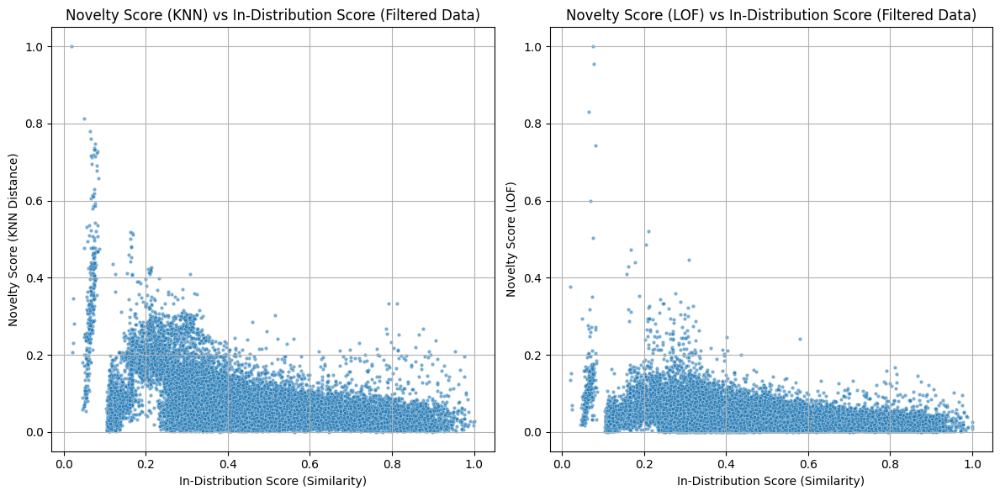

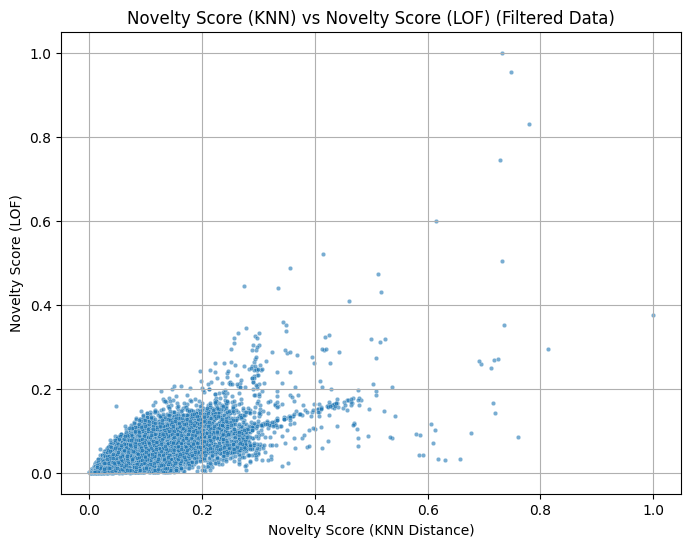

In [ ]:
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import LocalOutlierFactor
import numpy as np
import pandas as pd # 确保pandas已导入
import matplotlib.pyplot as plt # 确保绘图库已导入
import seaborn as sns # 确保seaborn已导入


def compute_novelty_score_knn(real_data_subset, synthetic_data_subset, k=5):
    """
    计算生成样本相对于真实数据的新颖性评分 (基于 K 近邻距离)。

    Args:
        real_data_subset (pd.DataFrame): 用于计算距离的真实数据子集。
        synthetic_data_subset (pd.DataFrame): 需要计算新颖性评分的生成数据子集。
        k (int): 用于计算平均距离的最近邻数量。

    Returns:
        np.ndarray: 每个生成样本的新颖性评分数组 (距离越大，分数越高)。
    """
    # 确保数据是数值类型且没有NaN
    real_data_subset = real_data_subset.select_dtypes(include=np.number).dropna()
    synthetic_data_subset = synthetic_data_subset.select_dtypes(include=np.number).dropna()

    if real_data_subset.empty or synthetic_data_subset.empty:
        print("警告: 计算新颖性分数的数据中包含 NaN 或为空。")
        return np.zeros(len(synthetic_data_subset)) # 返回0分

    # 确保列匹配且顺序一致
    common_cols = list(real_data_subset.columns.intersection(synthetic_data_subset.columns))
    real_data_subset = real_data_subset[common_cols]
    synthetic_data_subset = synthetic_data_subset[common_cols]

    if real_data_subset.empty or synthetic_data_subset.empty:
         print("警告: 计算新颖性分数的公共列数据中包含 NaN 或为空。")
         return np.zeros(len(synthetic_data_subset))

    # 训练最近邻模型
    # 注意：我们只需要找到每个生成样本在真实数据中的最近邻
    nn = NearestNeighbors(n_neighbors=k, algorithm='auto')
    nn.fit(real_data_subset)

    # 计算每个生成样本到最近 K 个真实样本的距离
    distances, _ = nn.kneighbors(synthetic_data_subset)

    # 计算平均距离作为原始新颖性分数
    # 使用 np.mean(distances, axis=1) 如果 k > 1
    # 使用 distances.flatten() 如果 k == 1
    if k > 1:
        raw_novelty_scores = np.mean(distances, axis=1)
    else:
        raw_novelty_scores = distances.flatten()


    # 归一化新颖性分数到 0-1 范围 (距离越大，分数越高)
    score_min, score_max = raw_novelty_scores.min(), raw_novelty_scores.max()
    if score_max == score_min:
        normalized_novelty_scores = np.zeros_like(raw_novelty_scores)
    else:
        normalized_novelty_scores = (raw_novelty_scores - score_min) / (score_max - score_min)

    return normalized_novelty_scores


def compute_novelty_score_lof(real_data_subset, synthetic_data_subset, n_neighbors=20):
    """
    计算生成样本相对于真实数据的新颖性评分 (基于 LOF)。

    Args:
        real_data_subset (pd.DataFrame): 用于计算离群因子的真实数据子集。
        synthetic_data_subset (pd.DataFrame): 需要计算新颖性评分的生成数据子集。
        n_neighbors (int): LOF 算法中使用的邻居数量。

    Returns:
        np.ndarray: 每个生成样本的新颖性评分数组 (值越大，越可能是离群点/越新颖)。
    """
    # 确保数据是数值类型且没有NaN
    real_data_subset = real_data_subset.select_dtypes(include=np.number).dropna()
    synthetic_data_subset = synthetic_data_subset.select_dtypes(include=np.number).dropna()

    if real_data_subset.empty or synthetic_data_subset.empty:
        print("警告: 计算 LOF 新颖性分数的数据中包含 NaN 或为空。")
        return np.zeros(len(synthetic_data_subset)) # 返回0分

    # 确保列匹配且顺序一致
    common_cols = list(real_data_subset.columns.intersection(synthetic_data_subset.columns))
    real_data_subset = real_data_subset[common_cols]
    synthetic_data_subset = synthetic_data_subset[common_cols]

    if real_data_subset.empty or synthetic_data_subset.empty:
         print("警告: 计算 LOF 新颖性分数的公共列数据中包含 NaN 或为空。")
         return np.zeros(len(synthetic_data_subset))

    # 训练 LOF 模型 (novelty=True 表示用于新颖性检测，而不是离群点检测)
    # 注意：LOF 分数通常是负值，值越接近 0 或为正，越是离群点。
    # decision_function 返回的值是 -LOF。所以值越大，LOF值越小，越不是离群点。
    # 我们想要值越大越新颖，所以直接使用 -decision_function 或者 1 / (-decision_function)
    # 更简单的是，直接使用 decision_function 的相反数作为原始新颖性分数 (分数越大越新颖)
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, novelty=True)

    # 在真实数据上拟合模型
    lof.fit(real_data_subset)

    # 对生成数据计算新颖性分数 (decision_function 返回的是负 LOF 值)
    # 为了让分数越大越新颖，我们取其相反数
    raw_novelty_scores = -lof.decision_function(synthetic_data_subset)

    # LOF 分数通常没有固定的上下界，这里我们进行一个简单的 min-max 归一化到 0-1 范围
    # 也可以考虑使用其他方法，比如 rank-based normalization
    score_min, score_max = raw_novelty_scores.min(), raw_novelty_scores.max()
    if score_max == score_min:
        normalized_novelty_scores = np.zeros_like(raw_novelty_scores)
    else:
         # 防止除以零
        normalized_novelty_scores = (raw_novelty_scores - score_min) / (score_max - score_min + 1e-9)


    return normalized_novelty_scores


# 定义用于计算新颖性分数的数值列
# 排除 'freq_fan_sum' 以及任何非数值或用于物理/范围过滤的列
numerical_cols_for_metrics = real_data.select_dtypes(include=np.number).columns.tolist()
# 排除 'freq_fan_sum' 如果它存在
if 'freq_fan_sum' in numerical_cols_for_metrics:
    numerical_cols_for_metrics.remove('freq_fan_sum')

# 计算 filtered_data 的 K 近邻新颖性评分
# 在 filtered_data 上计算，因为它已经满足物理约束
filtered_data['novelty_score_knn'] = compute_novelty_score_knn(
    real_data[numerical_cols_for_metrics], # 使用原始数据训练模型
    filtered_data[numerical_cols_for_metrics], # 在过滤后的数据上计算新颖性
    k=5 # 可以调整 K 值
)

# 计算 filtered_data 的 LOF 新颖性评分
# 在 filtered_data 上计算
filtered_data['novelty_score_lof'] = compute_novelty_score_lof(
    real_data[numerical_cols_for_metrics], # 使用原始数据训练模型
    filtered_data[numerical_cols_for_metrics], # 在过滤后的数据上计算新颖性
    n_neighbors=20 # 可以调整邻居数
)


print("已为 filtered_data 添加基于 K 近邻和 LOF 的新颖性评分。")

# 显示包含新颖性评分的 filtered_data 的前几行
print("\n包含新颖性评分的 filtered_data (前5行):")
display(filtered_data.head())

# 可视化新颖性分数与分布相似性分数的关系 (K 近邻 vs 分布相似性)
# 注意：这里使用 filtered_data 进行可视化
if 'in_distribution_score' in filtered_data.columns:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1) # 第一个子图：K 近邻 vs 分布相似性
    sns.scatterplot(
        data=filtered_data,
        x='in_distribution_score',
        y='novelty_score_knn',
        alpha=0.6,
        s=10 # 调整点的大小以便查看分布
    )
    plt.title('Novelty Score (KNN) vs In-Distribution Score (Filtered Data)')
    plt.xlabel('In-Distribution Score (Similarity)')
    plt.ylabel('Novelty Score (KNN Distance)')
    plt.grid(True)

    # 可视化新颖性分数与分布相似性分数的关系 (LOF vs 分布相似性)
    plt.subplot(1, 2, 2) # 第二个子图：LOF vs 分布相似性
    sns.scatterplot(
        data=filtered_data,
        x='in_distribution_score',
        y='novelty_score_lof',
        alpha=0.6,
        s=10 # 调整点的大小以便查看分布
    )
    plt.title('Novelty Score (LOF) vs In-Distribution Score (Filtered Data)')
    plt.xlabel('In-Distribution Score (Similarity)')
    plt.ylabel('Novelty Score (LOF)')
    plt.grid(True)


    plt.tight_layout()
    plt.show()
else:
    print("\n'in_distribution_score' 列不存在，跳过可视化。")

# 可视化 K 近邻新颖性与 LOF 新颖性的关系
# 注意：这里使用 filtered_data 进行可视化
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=filtered_data,
    x='novelty_score_knn',
    y='novelty_score_lof',
    alpha=0.6,
    s=10
)
plt.title('Novelty Score (KNN) vs Novelty Score (LOF) (Filtered Data)')
plt.xlabel('Novelty Score (KNN Distance)')
plt.ylabel('Novelty Score (LOF)')
plt.grid(True)
plt.show()

### K 近邻 (K-Nearest Neighbors, kNN) 新颖性评分说明

K 近邻方法在新颖性评分中的应用相对直观。其基本思想是：一个样本点越是“新颖”或越可能是离群点，它距离现有数据点的距离就越远。

具体步骤如下：

1.  **选择 K 值**：确定用于计算最近邻的 K 值。K 值的大小会影响新颖性判断的“局部性”。K 较小更关注点周围的微小区域，K 较大则考虑更广泛的邻域。
2.  **构建最近邻模型**：在**真实数据集**上训练一个 K 近邻模型。这个模型的作用是能够快速找到任何给定点在真实数据集中最近的 K 个邻居。
3.  **计算距离**：对于每一个**生成样本**，找到它在真实数据集中的 K 个最近邻。然后计算该生成样本到这 K 个最近邻的距离。
4.  **计算原始新颖性分数**：通常使用这 K 个距离的平均值作为该生成样本的原始新颖性分数。平均距离越大，原始新颖性分数越高。
5.  **归一化 (可选但推荐)**：将原始新颖性分数进行归一化（例如，缩放到 0 到 1 的范围），以便于比较和解释。归一化后的分数越大，表明该生成样本相对于真实数据越新颖。

**优点：**
*   概念简单，易于理解。
*   实现相对容易。

**缺点：**
*   计算成本较高，特别是对于大型数据集。
*   对数据中的尺度（不同特征的数值范围）非常敏感，通常需要先对数据进行标准化或归一化处理。
*   在数据密度不均匀的情况下，可能无法很好地区分不同区域的离群点。

---

### 局部离群因子 (Local Outlier Factor, LOF) 新颖性评分说明

LOF 是一种基于密度的离群点检测算法，它考虑了数据点周围的局部密度。LOF 认为，一个点的离群程度取决于它相对于其邻居的局部密度。

具体步骤（简化理解）：

1.  **选择 K 值**：同样需要选择用于定义“局部”的邻居数 K。
2.  **计算可达距离 (Reachability Distance)**：对于点 A 和点 B，计算点 A 到点 B 的可达距离。这个距离考虑了点 B 的局部密度，目的是平滑距离的波动。
3.  **计算局部可达密度 (Local Reachability Density, LRD)**：对于点 A，计算其局部可达密度，这是点 A 到其 K 个邻居的平均可达距离的倒数。密度越高，LRD 值越大。
4.  **计算局部离群因子 (LOF)**：对于点 A，计算其 LOF 分数。这是点 A 的局部可达密度与其 K 个邻居的**平均局部可达密度**的比值。
    *   如果点 A 的 LRD 与其邻居的平均 LRD 相似，LOF 分数接近 1。
    *   如果点 A 的 LRD 显著低于其邻居的平均 LRD，LOF 分数会大于 1，表明点 A 是一个局部离群点。LOF 分数越大，局部离群程度越高。
5.  **用于新颖性检测**：在 scikit-learn 等库中，LOF 算法可以通过设置 `novelty=True` 参数来用于新颖性检测。在这种模式下，模型在真实数据上进行拟合，然后对新的（生成）数据计算一个分数（通常是 `decision_function` 的输出）。这个分数与传统的 LOF 分数有关，值越大通常表示越新颖或越可能是离群点。我们通常会对此分数进行处理（例如取负号或归一化）以便于解释，使其符合“分数越高越新颖”的直觉。

**优点：**
*   能够有效地检测不同密度区域中的离群点，对数据密度不均匀的情况有较好的适应性。
*   提供了每个点的局部离群程度的量化指标。

**缺点：**
*   概念比 K 近邻复杂。
*   参数选择（如邻居数）对结果影响较大。
*   计算成本比 K 近邻高。
*   对高维数据敏感，可能需要降维或特征选择。

**总结：**

*   如果您主要关注样本与整体数据中心的距离，K 近邻是一个简单有效的选择。
*   如果您需要识别位于稀疏区域边缘或在局部环境中显得异常的点，即使这些区域离数据中心较近，LOF 可能更适合。

在您的冷却塔数据场景中，由于数据可能在不同运行模式下形成不同的密度区域，LOF 可能会更好地帮助您识别那些处于不同运行模式边界或过渡区域的“新颖”样本。

In [ ]:
# 确保 'in_distribution_score' 和 'novelty_score_knn' 列存在
if 'in_distribution_score' not in filtered_data.columns: # Changed from synthetic_data
    print("'in_distribution_score' 列不存在于 filtered_data 中。请先计算分布相似性评分并过滤数据。")
elif 'novelty_score_knn' not in filtered_data.columns and 'novelty_score_lof' not in filtered_data.columns: # Changed from synthetic_data
     print("新颖性评分列 ('novelty_score_knn' 或 'novelty_score_lof') 不存在于 filtered_data 中。请先计算新颖性评分。")
else:
    # 选择用于高新颖性的评分列 (优先 KNN，如果不存在则使用 LOF)
    novelty_score_col = 'novelty_score_knn'
    if novelty_score_col not in filtered_data.columns: # Changed from synthetic_data
        novelty_score_col = 'novelty_score_lof'
        print(f"使用 {novelty_score_col} 作为新颖性评分。")

    # 选择高相似性数据 (例如，取相似性分数最高的1000条)
    # Changed from synthetic_data
    high_similarity_data = filtered_data.nlargest(min(1000, len(filtered_data)), 'in_distribution_score')

    # 选择高新颖性数据 (例如，取新颖性分数最高的1000条)
    # Changed from synthetic_data
    high_novelty_data = filtered_data.nlargest(min(1000, len(filtered_data)), novelty_score_col)

    # 定义要删除的物理约束列和范围惩罚列
    cols_to_drop = [
        'constraints_pass', 'c1_temp_out_le_temp_in', 'c2_temp_out_ge_wetbulb', 'c3_nonnegative',
        'range_penalty', 'any_out_of_range' # Added range penalty columns
    ]

    # 随机抽取10条高相似性数据（如果数据量足够）并删除指定列
    if len(high_similarity_data) >= 10:
        sample_high_similarity = high_similarity_data.sample(10, random_state=42).drop(columns=[col for col in cols_to_drop if col in high_similarity_data.columns])
        print("\n随机抽取的10条高分布相似性数据 (来自 filtered_data):")
        display(sample_high_similarity)
    else:
        print("\nfiltered_data 中高分布相似性数据不足10条，无法抽样。")
        display(high_similarity_data.drop(columns=[col for col in cols_to_drop if col in high_similarity_data.columns]))


    # 随机抽取10条高新颖性数据（如果数据量足够）并删除指定列
    if len(high_novelty_data) >= 10:
        sample_high_novelty = high_novelty_data.sample(10, random_state=42).drop(columns=[col for col in cols_to_drop if col in high_novelty_data.columns])
        print(f"\n随机抽取的10条高 {novelty_score_col} 数据 (来自 filtered_data):")
        display(sample_high_novelty)
    else:
         print(f"\nfiltered_data 中高 {novelty_score_col} 数据不足10条，无法抽样。")
         display(high_novelty_data.drop(columns=[col for col in cols_to_drop if col in high_novelty_data.columns]))


随机抽取的10条高分布相似性数据 (来自 filtered_data):


,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,in_distribution_score,credibility_score,novelty_score_knn,novelty_score_lof
45153,29.827303,27.406567,49.254432,49.732353,49.498811,902.363579,29.048959,66.887074,0.878810,0.876389,0.037380,0.019357
20274,30.139627,26.922395,49.259420,49.675750,49.483970,895.725255,30.149194,72.477329,0.865000,0.862303,0.037773,0.019080
19078,30.184396,27.536228,49.234435,49.702243,49.481588,856.541399,30.476497,73.066891,0.864835,0.862135,0.021167,0.013612
3522,30.927684,27.950418,49.207313,49.724220,49.476688,853.654617,28.810176,70.488400,0.869374,0.866765,0.012670,0.003562
20455,31.062641,27.841346,49.264114,49.690151,49.510906,864.548849,31.173673,69.236668,0.887067,0.884811,0.013973,0.006545
17997,30.016064,27.466030,49.238591,49.672766,49.485155,951.616039,30.529082,63.748299,0.868591,0.865967,0.011150,0.000923
19161,30.146098,27.062062,49.218522,49.697189,49.470541,871.352132,29.896706,66.581554,0.871951,0.869394,0.068142,0.056601
4923,30.332412,27.992523,49.261422,49.680389,49.492282,864.897372,31.203249,70.392407,0.879378,0.876969,0.026082,0.018644
34440,30.896207,27.946285,49.217151,49.686227,49.487729,866.049982,30.417529,64.144573,0.856208,0.853336,0.027155,0.018093
44591,30.348517,28.368237,49.269000,49.688016,49.463917,958.464727,30.242881,67.495007,0.920020,0.918423,0.046662,0.029067



随机抽取的10条高 novelty_score_knn 数据 (来自 filtered_data):


,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,in_distribution_score,credibility_score,novelty_score_knn,novelty_score_lof
25360,29.314113,26.812832,49.229831,29.674300,29.668314,794.845251,29.519976,68.044344,0.216225,0.200572,0.263524,0.056739
2023,29.789678,26.921517,32.408638,49.745632,49.505866,795.625521,28.619370,81.601873,0.322963,0.309442,0.241072,0.104010
8633,29.867584,26.403812,49.241725,32.646842,49.499425,796.434960,28.551109,75.700221,0.351554,0.338603,0.240897,0.062415
32738,26.036289,23.967938,45.164311,35.185921,0.029233,786.318990,22.760004,87.675905,0.063117,0.044406,0.248400,0.090917
20068,31.216971,28.452514,49.220682,49.714811,49.478559,1440.824767,35.371091,42.433748,0.284812,0.270529,0.274547,0.126329
13588,26.643978,25.300589,49.250522,49.751138,29.977274,784.682046,23.845842,83.301204,0.230250,0.214876,0.246206,0.147591
35037,30.364388,27.935697,49.253140,35.241644,34.068372,796.978718,30.474186,81.819303,0.293535,0.279426,0.253444,0.066118
23281,26.654881,24.125198,36.971826,45.408682,0.710081,789.300369,22.883379,82.968761,0.068217,0.049608,0.264591,0.097409
23021,34.516812,30.735967,49.161934,49.672032,49.434540,1389.267085,38.442486,46.648602,0.235117,0.219841,0.228879,0.026462
49423,26.276543,23.941195,0.989437,46.191067,47.360320,784.054984,24.190259,82.741191,0.065463,0.046798,0.365122,0.205091


In [ ]:
# temp = real_data[
#     (real_data['temp_dry_bulb'] > 22) & (real_data['temp_dry_bulb'] < 23) & (real_data['ratio_humidity'] > 82) & (real_data['ratio_humidity'] < 92) & (real_data['flow_cow'] > 780) & (real_data['flow_cow'] < 800) & (real_data['freq_fan_2'] < 35)
#     ]
temp = real_data[
    (real_data['temp_dry_bulb'] >= 22.7) & (real_data['temp_dry_bulb'] <= 22.8) & (real_data['ratio_humidity'] > 87.6) & (real_data['ratio_humidity'] < 87.7)
    ]
temp_s = filtered_data[
    (filtered_data['temp_dry_bulb'] >= 22.7) & (filtered_data['temp_dry_bulb'] <= 22.8) & (filtered_data['ratio_humidity'] > 87.6) & (filtered_data['ratio_humidity'] < 87.7)
    ]
print(len(temp))
print(len(temp_s))
# print(temp[:10])
print(temp)
print(temp_s)

8
3
       temp_in  temp_out  freq_fan_1  freq_fan_2  freq_fan_3  flow_cow  \
1013     27.72     24.81       49.35       49.69       49.53    757.70   
49637    26.53     24.01       49.25       49.75       49.51    557.00   
49671    26.55     24.02       48.46       48.96       48.69    556.68   
49825    26.42     23.97       48.66       49.10       48.84    557.00   
49933    27.03     24.08       49.28       49.72       49.52    556.77   
49947    27.20     24.17       49.29       49.76       49.53    556.44   
49964    27.50     24.30       49.31       49.77       49.50    557.29   
50065    27.97     24.64       49.31       49.77       49.54    556.72   

       temp_dry_bulb  ratio_humidity  
1013           22.79           87.63  
49637          22.79           87.65  
49671          22.79           87.67  
49825          22.78           87.63  
49933          22.70           87.63  
49947          22.79           87.64  
49964          22.70           87.67  
50065          22

In [ ]:
tdb = real_data['temp_dry_bulb']
rh = real_data['ratio_humidity']
res = []
for tdb_value, rh_value in zip(tdb, rh):
  if 22.7 < tdb_value < 22.8 and 87.6 < rh_value < 87.7:
    # print(tdb_value, rh_value)
    res.append((tdb_value, rh_value))
print(len(res))
print(res[:6])

6
[(22.79, 87.63), (22.79, 87.65), (22.79, 87.67), (22.78, 87.63), (22.79, 87.64), (22.78, 87.64)]


## 分布相似性评估

CTGAN 生成数据质量综合评估报告

1. 基本统计:
   真实数据形状: (128122, 8)
   生成数据形状: (50000, 8)
   变量类型: 0个离散, 8个连续

2. 统计相似性评估:
   总体相似度: 0.921
   数值变量相似度:
     temp_in: 0.960 (KS=0.040)
     temp_out: 0.957 (KS=0.043)
     freq_fan_1: 0.863 (KS=0.137)
     freq_fan_2: 0.891 (KS=0.109)
     freq_fan_3: 0.895 (KS=0.105)
     flow_cow: 0.943 (KS=0.057)
     temp_dry_bulb: 0.913 (KS=0.087)
     ratio_humidity: 0.950 (KS=0.050)
   分类变量相似度:

3. 相关性结构评估:
   相关性相似度: 0.986
   相关性MAE: 0.057

4. 分布重叠评估:
   平均最近邻距离: 4.868
   覆盖率: 0.328

6. 综合质量评级:
   综合质量分数: 0.818
   质量评级: 优秀


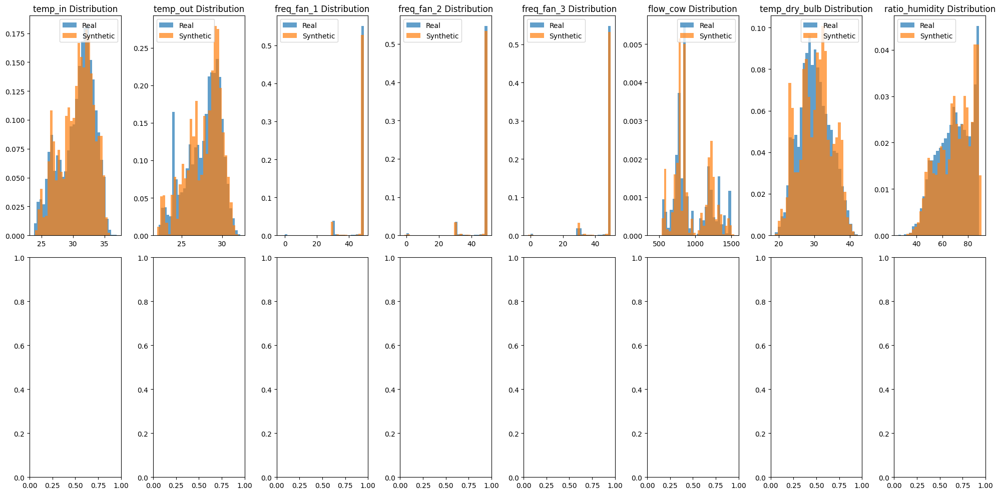

In [ ]:
import scipy.stats as stats
from sklearn.metrics import mutual_info_score
import numpy as np
import pandas as pd

def statistical_similarity(real_data, synthetic_data, discrete_columns):
    """统计相似性评估"""

    results = {}

    # 数值变量评估
    numerical_cols = [col for col in real_data.columns if col not in discrete_columns]

    numerical_similarity = {}
    for col in numerical_cols:
        # KS检验
        ks_stat, ks_p = stats.ks_2samp(real_data[col].dropna(), synthetic_data[col].dropna())

        # 均值比和标准差比
        mean_ratio = synthetic_data[col].mean() / real_data[col].mean()
        std_ratio = synthetic_data[col].std() / real_data[col].std()

        numerical_similarity[col] = {
            'ks_statistic': ks_stat,
            'ks_pvalue': ks_p,
            'mean_ratio': mean_ratio,
            'std_ratio': std_ratio,
            'similarity_score': 1 - ks_stat  # KS统计量越小越相似
        }

    # 分类变量评估
    categorical_similarity = {}
    for col in discrete_columns:
        # 计算频率分布差异
        real_freq = real_data[col].value_counts(normalize=True)
        synth_freq = synthetic_data[col].value_counts(normalize=True)

        # 确保相同的索引
        all_categories = set(real_freq.index) | set(synth_freq.index)
        real_freq = real_freq.reindex(all_categories, fill_value=0)
        synth_freq = synth_freq.reindex(all_categories, fill_value=0)

        # JS散度
        js_divergence = jensen_shannon_divergence(real_freq, synth_freq)

        # 互信息
        mi = mutual_info_score(real_data[col], synthetic_data[col])

        categorical_similarity[col] = {
            'js_divergence': js_divergence,
            'mutual_information': mi,
            'similarity_score': 1 - js_divergence
        }

    results['numerical'] = numerical_similarity
    results['categorical'] = categorical_similarity

    # 总体相似度
    all_scores = ([v['similarity_score'] for v in numerical_similarity.values()] +
                  [v['similarity_score'] for v in categorical_similarity.values()])
    results['overall_similarity'] = np.mean(all_scores)

    return results

def jensen_shannon_divergence(p, q):
    """计算JS散度"""
    p = np.array(p)
    q = np.array(q)
    m = 0.5 * (p + q)
    return 0.5 * (stats.entropy(p, m) + stats.entropy(q, m))


def correlation_similarity(real_data, synthetic_data, discrete_columns):
    """评估相关性结构的相似性"""

    # 选择数值列计算相关性
    numerical_cols = [col for col in real_data.columns if col not in discrete_columns]

    if len(numerical_cols) < 2:
        return {'correlation_similarity': 1.0}  # 如果数值列太少

    real_corr = real_data[numerical_cols].corr().values
    synth_corr = synthetic_data[numerical_cols].corr().values

    # 相关性矩阵的相似度
    corr_correlation = np.corrcoef(real_corr.flatten(), synth_corr.flatten())[0, 1]

    # 平均绝对误差
    mae = np.mean(np.abs(real_corr - synth_corr))

    return {
        'correlation_correlation': corr_correlation,
        'correlation_mae': mae,
        'correlation_similarity': corr_correlation
    }

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.preprocessing import LabelEncoder

def ml_utility_evaluation(real_data, synthetic_data, target_column):
    """机器学习效用评估"""

    # 准备数据
    X_real = real_data.drop(target_column, axis=1)
    y_real = real_data[target_column]

    X_synth = synthetic_data.drop(target_column, axis=1)
    y_synth = synthetic_data[target_column]

    # 编码分类变量
    le = LabelEncoder()
    y_real_encoded = le.fit_transform(y_real)
    y_synth_encoded = le.transform(y_synth)

    # 分割真实数据
    X_train, X_test, y_train, y_test = train_test_split(
        X_real, y_real_encoded, test_size=0.3, random_state=42
    )

    results = {}

    # 测试不同模型
    models = {
        'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
        'LogisticRegression': LogisticRegression(random_state=42)
    }

    for model_name, model in models.items():
        # 在真实数据上训练
        model.fit(X_train, y_train)

        # 在真实测试集上评估
        real_test_score = accuracy_score(y_test, model.predict(X_test))

        # 在生成数据上评估
        synth_score = accuracy_score(y_synth_encoded, model.predict(X_synth))

        results[model_name] = {
            'real_test_accuracy': real_test_score,
            'synthetic_accuracy': synth_score,
            'accuracy_ratio': synth_score / real_test_score if real_test_score > 0 else 0
        }

    return results

from sklearn.neighbors import NearestNeighbors

def distribution_overlap(real_data, synthetic_data, k=5):
    """评估分布重叠程度"""

    # 数值化所有特征
    real_encoded = pd.get_dummies(real_data)
    synth_encoded = pd.get_dummies(synthetic_data)

    # 确保相同的列
    common_cols = real_encoded.columns.intersection(synth_encoded.columns)
    real_encoded = real_encoded[common_cols]
    synth_encoded = synth_encoded[common_cols]

    # 训练最近邻模型
    nn = NearestNeighbors(n_neighbors=k)
    nn.fit(real_encoded)

    # 计算每个生成样本到最近真实样本的距离
    distances, indices = nn.kneighbors(synth_encoded)
    avg_distances = distances.mean(axis=1)

    # 计算覆盖率
    coverage = len(set(indices.flatten())) / len(real_data)

    return {
        'avg_nearest_neighbor_distance': np.mean(avg_distances),
        'coverage_ratio': coverage,
        'distance_std': np.std(avg_distances)
    }

import matplotlib.pyplot as plt
import seaborn as sns

def visualization_comparison(real_data, synthetic_data, discrete_columns):
    """可视化比较"""

    numerical_cols = [col for col in real_data.columns if col not in discrete_columns]

    # 创建子图
    n_numerical = len(numerical_cols)
    n_categorical = min(3, len(discrete_columns))  # 只显示前3个分类变量

    fig, axes = plt.subplots(2, max(n_numerical, n_categorical), figsize=(20, 10))

    # 数值变量分布比较
    for i, col in enumerate(numerical_cols[:n_numerical]):
        axes[0, i].hist(real_data[col], bins=30, alpha=0.7, label='Real', density=True)
        axes[0, i].hist(synthetic_data[col], bins=30, alpha=0.7, label='Synthetic', density=True)
        axes[0, i].set_title(f'{col} Distribution')
        axes[0, i].legend()

    # 分类变量分布比较
    for i, col in enumerate(discrete_columns[:n_categorical]):
        real_counts = real_data[col].value_counts(normalize=True).head(5)
        synth_counts = synthetic_data[col].value_counts(normalize=True).head(5)

        df_plot = pd.DataFrame({'Real': real_counts, 'Synthetic': synth_counts})
        df_plot.plot(kind='bar', ax=axes[1, i], alpha=0.7)
        axes[1, i].set_title(f'{col} Distribution')
        axes[1, i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

def comprehensive_evaluation_report(real_data, synthetic_data, discrete_columns, target_column=None):
    """生成综合评估报告"""

    print("=" * 60)
    print("CTGAN 生成数据质量综合评估报告")
    print("=" * 60)

    # 1. 基本统计
    print(f"\n1. 基本统计:")
    print(f"   真实数据形状: {real_data.shape}")
    print(f"   生成数据形状: {synthetic_data.shape}")
    print(f"   变量类型: {len(discrete_columns)}个离散, {real_data.shape[1]-len(discrete_columns)}个连续")

    # 2. 统计相似性
    print(f"\n2. 统计相似性评估:")
    stats_results = statistical_similarity(real_data, synthetic_data, discrete_columns)
    print(f"   总体相似度: {stats_results['overall_similarity']:.3f}")

    # 数值变量
    print(f"   数值变量相似度:")
    for col, scores in stats_results['numerical'].items():
        print(f"     {col}: {scores['similarity_score']:.3f} (KS={scores['ks_statistic']:.3f})")

    # 分类变量
    print(f"   分类变量相似度:")
    for col, scores in stats_results['categorical'].items():
        print(f"     {col}: {scores['similarity_score']:.3f} (JS={scores['js_divergence']:.3f})")

    # 3. 相关性结构
    print(f"\n3. 相关性结构评估:")
    corr_results = correlation_similarity(real_data, synthetic_data, discrete_columns)
    print(f"   相关性相似度: {corr_results['correlation_similarity']:.3f}")
    print(f"   相关性MAE: {corr_results['correlation_mae']:.3f}")

    # 4. 分布重叠
    print(f"\n4. 分布重叠评估:")
    overlap_results = distribution_overlap(real_data, synthetic_data)
    print(f"   平均最近邻距离: {overlap_results['avg_nearest_neighbor_distance']:.3f}")
    print(f"   覆盖率: {overlap_results['coverage_ratio']:.3f}")

    # 5. 机器学习效用（如果有目标变量）
    if target_column and target_column in real_data.columns:
        print(f"\n5. 机器学习效用评估:")
        ml_results = ml_utility_evaluation(real_data, synthetic_data, target_column)
        for model_name, scores in ml_results.items():
            print(f"   {model_name}:")
            print(f"     真实数据准确率: {scores['real_test_accuracy']:.3f}")
            print(f"     生成数据准确率: {scores['synthetic_accuracy']:.3f}")
            print(f"     准确率比率: {scores['accuracy_ratio']:.3f}")

    # 6. 质量评级
    print(f"\n6. 综合质量评级:")
    overall_score = (
        stats_results['overall_similarity'] * 0.4 +
        corr_results['correlation_similarity'] * 0.3 +
        (1 - overlap_results['avg_nearest_neighbor_distance'] / 10) * 0.3  # 归一化距离
    )

    if overall_score > 0.8:
        rating = "优秀"
    elif overall_score > 0.6:
        rating = "良好"
    elif overall_score > 0.4:
        rating = "一般"
    else:
        rating = "需要改进"

    print(f"   综合质量分数: {overall_score:.3f}")
    print(f"   质量评级: {rating}")

    return {
        'overall_score': overall_score,
        'rating': rating,
        'statistical_similarity': stats_results,
        'correlation_similarity': corr_results,
        'distribution_overlap': overlap_results
    }

# 使用示例
evaluation_report = comprehensive_evaluation_report(
    real_data,
    synthetic_data,
    discrete_columns,
    target_column='income'  # 如果有目标变量的话
)

# 可视化比较
visualization_comparison(real_data, synthetic_data, discrete_columns)

In [ ]:
from ctgan import CTGAN

discrete_columns = []
ctgan_5eps = CTGAN(epochs=5)
ctgan_5eps.fit(real_data, discrete_columns)

In [ ]:
# Create synthetic data
synthetic_data_5eps = ctgan_5eps.sample(50000)

CTGAN 生成数据质量综合评估报告

1. 基本统计:
   真实数据形状: (128122, 8)
   生成数据形状: (50000, 8)
   变量类型: 0个离散, 8个连续

2. 统计相似性评估:
   总体相似度: 0.879
   数值变量相似度:
     temp_in: 0.898 (KS=0.102)
     temp_out: 0.945 (KS=0.055)
     freq_fan_1: 0.822 (KS=0.178)
     freq_fan_2: 0.816 (KS=0.184)
     freq_fan_3: 0.873 (KS=0.127)
     flow_cow: 0.854 (KS=0.146)
     temp_dry_bulb: 0.917 (KS=0.083)
     ratio_humidity: 0.904 (KS=0.096)
   分类变量相似度:

3. 相关性结构评估:
   相关性相似度: 0.478
   相关性MAE: 0.415

4. 分布重叠评估:
   平均最近邻距离: 10.827
   覆盖率: 0.256

6. 综合质量评级:
   综合质量分数: 0.470
   质量评级: 一般


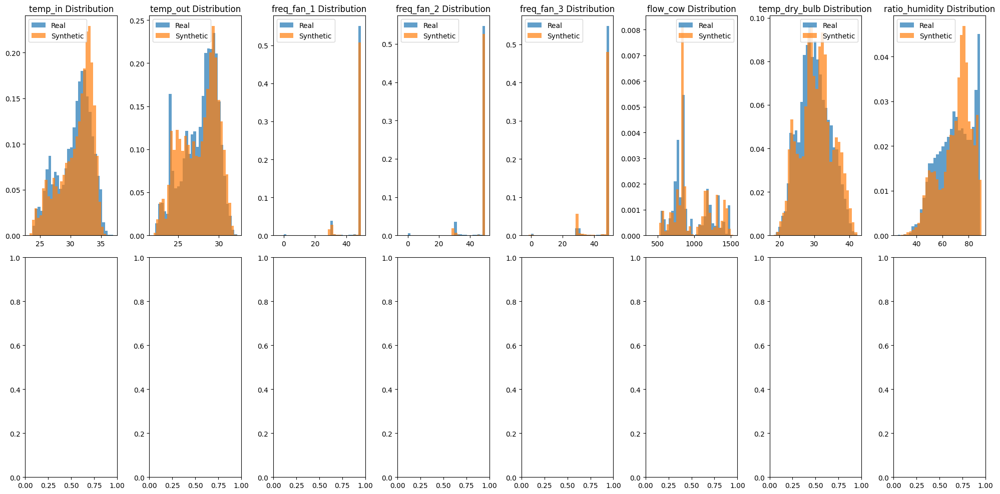

In [ ]:
evaluation_report = comprehensive_evaluation_report(
    real_data,
    synthetic_data_5eps,
    discrete_columns,
    # target_column='income'  # 如果有目标变量的话
)
visualization_comparison(real_data, synthetic_data_5eps, discrete_columns)

# 从生成的模拟数据出发进行数据分析

In [ ]:
import pandas as pd

real_data = pd.read_excel("cooling_tower_modeling_df.xlsx")

real_data = real_data.drop(columns = ['time'])

原始数据

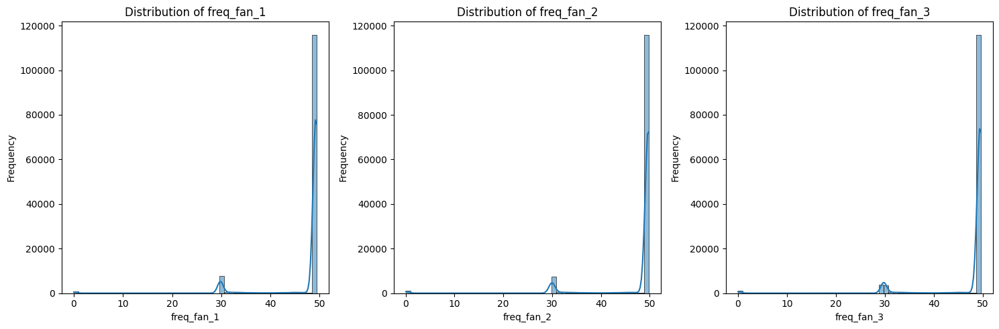

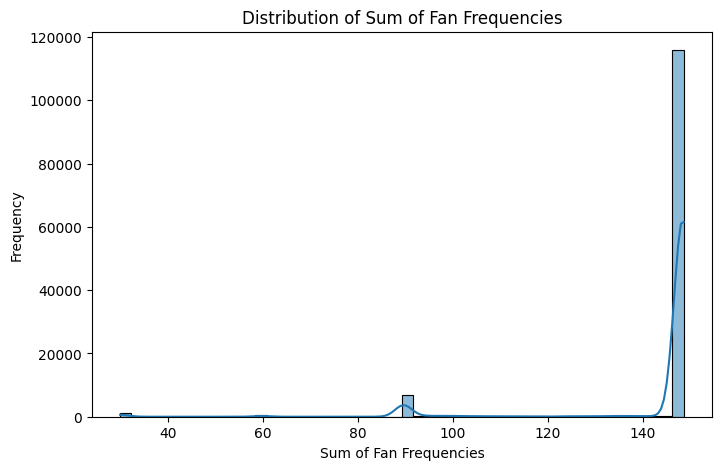

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 绘制单个风扇频率的分布图
fan_freq_cols = ['freq_fan_1', 'freq_fan_2', 'freq_fan_3']

plt.figure(figsize=(15, 5))

for i, col in enumerate(fan_freq_cols):
    plt.subplot(1, 3, i + 1)
    sns.histplot(real_data[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# 绘制风扇频率总和的分布图
# 注意：这里重新计算 freq_fan_sum 以防之前的单元格没有执行
real_data['freq_fan_sum'] = real_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)

plt.figure(figsize=(8, 5))
sns.histplot(real_data['freq_fan_sum'], bins=50, kde=True)
plt.title('Distribution of Sum of Fan Frequencies')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Frequency')
plt.show()

模拟数据

In [ ]:
import pandas as pd

synthetic_data = pd.read_excel("synthetic_data_cooler.xlsx")

In [ ]:
print(synthetic_data.columns)
print(synthetic_data.head())

Index(['temp_in', 'temp_out', 'freq_fan_1', 'freq_fan_2', 'freq_fan_3',
       'flow_cow', 'temp_dry_bulb', 'ratio_humidity'],
      dtype='object')
     temp_in   temp_out  freq_fan_1  freq_fan_2  freq_fan_3    flow_cow  \
0  24.159630  22.475578   29.729381   29.741877   29.629718  785.256388   
1  27.778462  24.063829   49.288494   49.708010   49.518389  855.949268   
2  26.592480  23.939416   49.229761   49.677021   49.463729  850.995451   
3  35.362514  30.509369   49.193473   49.676541   49.496779  649.061017   
4  31.810396  26.162999   49.244354   49.718766   49.484342  889.583690   

   temp_dry_bulb  ratio_humidity  
0      22.092649       65.750061  
1      26.537841       83.671198  
2      27.780481       85.708796  
3      30.391756       84.779560  
4      28.221989       62.298780  


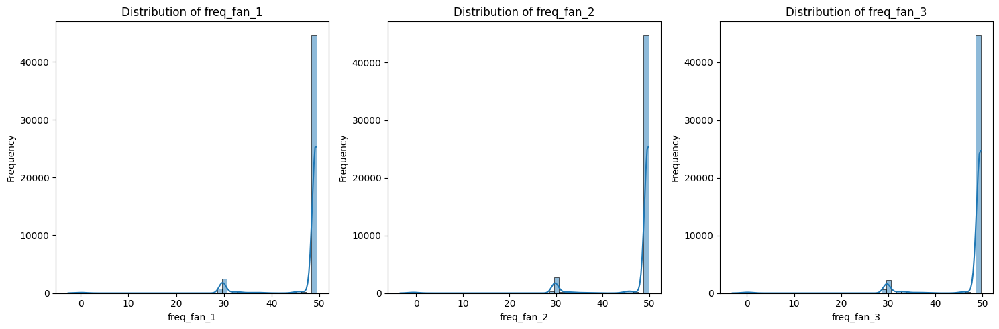

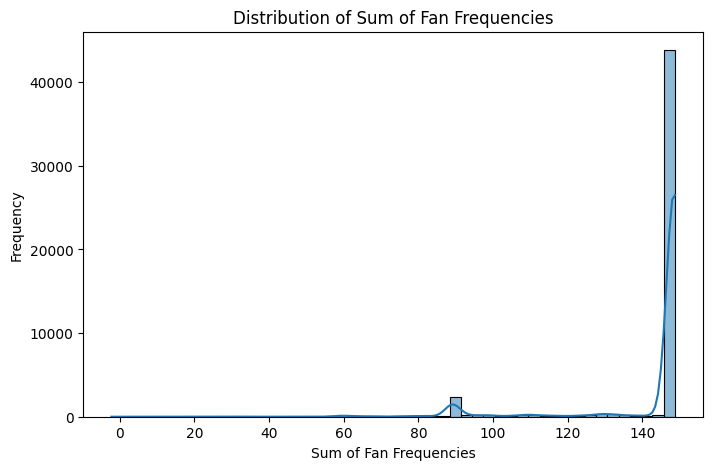

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 绘制单个风扇频率的分布图
fan_freq_cols = ['freq_fan_1', 'freq_fan_2', 'freq_fan_3']

plt.figure(figsize=(15, 5))

for i, col in enumerate(fan_freq_cols):
    plt.subplot(1, 3, i + 1)
    sns.histplot(synthetic_data[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# 绘制风扇频率总和的分布图
# 注意：这里重新计算 freq_fan_sum 以防之前的单元格没有执行
synthetic_data['freq_fan_sum'] = synthetic_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)

plt.figure(figsize=(8, 5))
sns.histplot(synthetic_data['freq_fan_sum'], bins=50, kde=True)
plt.title('Distribution of Sum of Fan Frequencies')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Frequency')
plt.show()

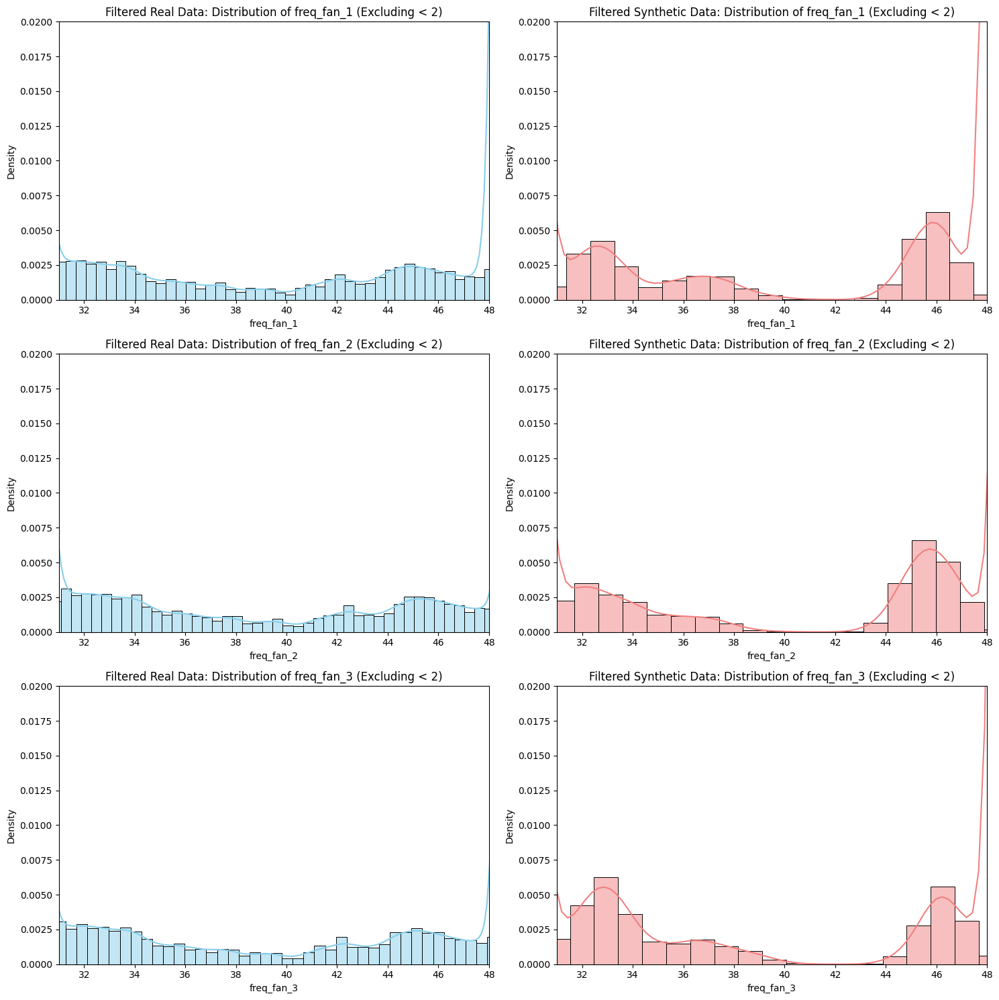

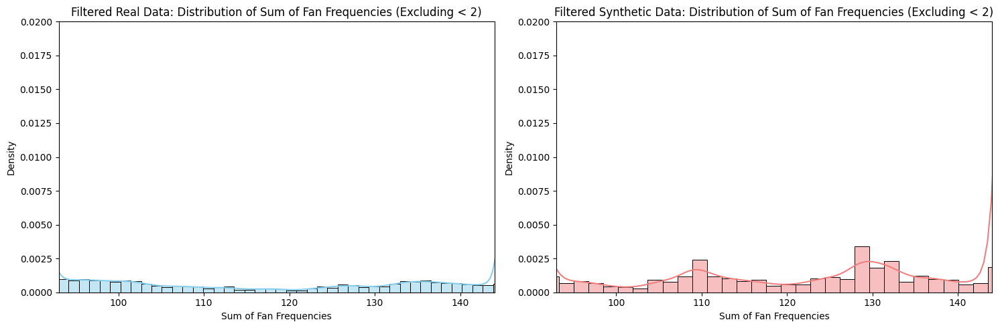

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define a threshold to exclude low frequencies (e.g., below 2)
low_freq_threshold = 2

# Define the desired x-axis range for plotting
plot_x_range = (31, 48) # Updated x-axis range

# Define the desired y-axis range for plotting (adjust as needed based on data)
# You might need to experiment with these values
plot_y_range_individual = (0, 0.02) # Example y-axis limit for individual frequencies (adjust)
plot_y_range_sum = (0, 0.02) # Example y-axis limit for sum of frequencies (adjust)


# Function to filter data based on low frequency threshold
def filter_low_freq_data(df, low_freq_threshold):
    filtered_df = df.copy()
    fan_freq_cols = ['freq_fan_1', 'freq_fan_2', 'freq_fan_3']

    # Filter out rows where any individual fan frequency is below the threshold
    for col in fan_freq_cols:
        filtered_df = filtered_df[filtered_df[col] >= low_freq_threshold]

    # Recalculate freq_fan_sum after filtering
    filtered_df['freq_fan_sum'] = filtered_df[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)

    return filtered_df


# Ensure real_data has 'freq_fan_sum' calculated initially for reference if needed
if 'freq_fan_sum' not in real_data.columns:
     real_data['freq_fan_sum'] = real_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)
# Do the same for synthetic_data if it was loaded without the sum
if 'freq_fan_sum' not in synthetic_data.columns:
     synthetic_data['freq_fan_sum'] = synthetic_data[['freq_fan_1', 'freq_fan_2', 'freq_fan_3']].sum(axis=1)


# Filter both real and synthetic data
filtered_real_data = filter_low_freq_data(real_data, low_freq_threshold)
filtered_synthetic_data = filter_low_freq_data(synthetic_data, low_freq_threshold)


# Plot individual filtered fan frequency distributions side-by-side
fan_freq_cols = ['freq_fan_1', 'freq_fan_2', 'freq_fan_3']

fig, axes = plt.subplots(len(fan_freq_cols), 2, figsize=(15, 5 * len(fan_freq_cols)))

for i, col in enumerate(fan_freq_cols):
    sns.histplot(filtered_real_data[col], bins=50, kde=True, ax=axes[i, 0], color='skyblue', stat='density') # Use density for better comparison
    axes[i, 0].set_title(f'Filtered Real Data: Distribution of {col} (Excluding < {low_freq_threshold})')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel('Density') # Changed ylabel to Density
    axes[i, 0].set_xlim(plot_x_range) # Set x-axis limit
    axes[i, 0].set_ylim(plot_y_range_individual) # Set y-axis limit


    sns.histplot(filtered_synthetic_data[col], bins=50, kde=True, ax=axes[i, 1], color='lightcoral', stat='density') # Use density
    axes[i, 1].set_title(f'Filtered Synthetic Data: Distribution of {col} (Excluding < {low_freq_threshold})')
    axes[i, 1].set_xlabel(col)
    axes[i, 1].set_ylabel('Density') # Changed ylabel to Density
    axes[i, 1].set_xlim(plot_x_range) # Set x-axis limit
    axes[i, 1].set_ylim(plot_y_range_individual) # Set y-axis limit


plt.tight_layout()
plt.show()

# Plot the distribution of the sum of filtered fan frequencies side-by-side
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.histplot(filtered_real_data['freq_fan_sum'], bins=50, kde=True, color='skyblue', stat='density') # Use density
plt.title(f'Filtered Real Data: Distribution of Sum of Fan Frequencies (Excluding < {low_freq_threshold})')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Density') # Changed ylabel to Density
plt.xlim(plot_x_range[0] * 3, plot_x_range[1] * 3) # Set x-axis limit for sum (assuming proportional range)
plt.ylim(plot_y_range_sum) # Set y-axis limit


plt.subplot(1, 2, 2)
sns.histplot(filtered_synthetic_data['freq_fan_sum'], bins=50, kde=True, color='lightcoral', stat='density') # Use density
plt.title(f'Filtered Synthetic Data: Distribution of Sum of Fan Frequencies (Excluding < {low_freq_threshold})')
plt.xlabel('Sum of Fan Frequencies')
plt.ylabel('Density') # Changed ylabel to Density
plt.xlim(plot_x_range[0] * 3, plot_x_range[1] * 3) # Set x-axis limit for sum (assuming proportional range)
plt.ylim(plot_y_range_sum) # Set y-axis limit


plt.tight_layout()
plt.show()

## 物理约束1

引入Q_total ≈ flow_cow * (temp_in - temp_out) * c_p，探究Q_total不变的情况下flow_cow 与 (temp_in - temp_out) 的相关关系

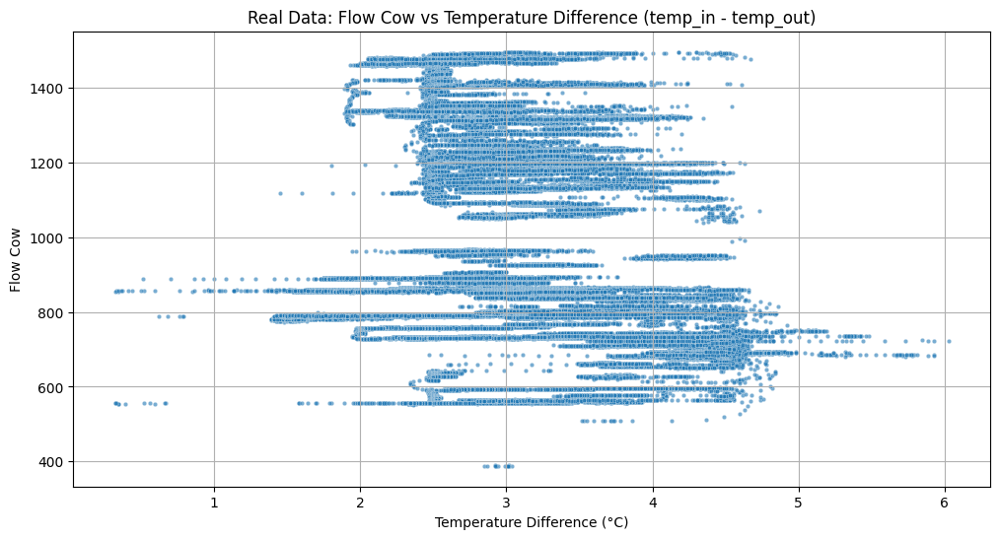

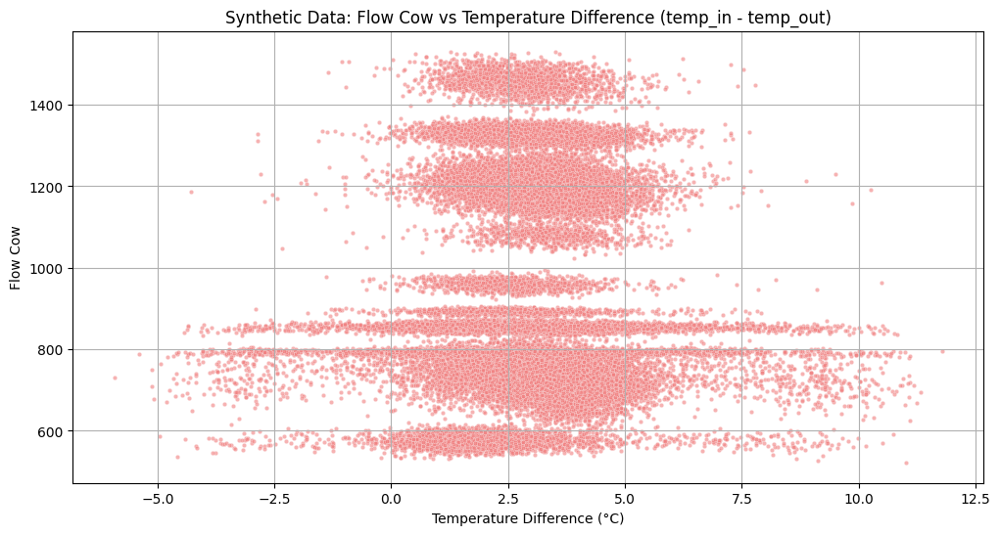

Correlation between Flow Cow and Temperature Difference (Real Data): -0.0640
Correlation between Flow Cow and Temperature Difference (Synthetic Data): 0.0749


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Calculate the temperature difference for both real and synthetic data
real_data['temp_diff'] = real_data['temp_in'] - real_data['temp_out']
synthetic_data['temp_diff'] = synthetic_data['temp_in'] - synthetic_data['temp_out']

# Plot the relationship between flow_cow and temp_diff for real data
plt.figure(figsize=(12, 6))
sns.scatterplot(data=real_data, x='temp_diff', y='flow_cow', alpha=0.6, s=10)
plt.title('Real Data: Flow Cow vs Temperature Difference (temp_in - temp_out)')
plt.xlabel('Temperature Difference (°C)')
plt.ylabel('Flow Cow')
plt.grid(True)
plt.show()

# Plot the relationship between flow_cow and temp_diff for synthetic data
plt.figure(figsize=(12, 6))
sns.scatterplot(data=synthetic_data, x='temp_diff', y='flow_cow', alpha=0.6, s=10, color='lightcoral')
plt.title('Synthetic Data: Flow Cow vs Temperature Difference (temp_in - temp_out)')
plt.xlabel('Temperature Difference (°C)')
plt.ylabel('Flow Cow')
plt.grid(True)
plt.show()

# Calculate and print the correlation coefficient for both datasets
real_corr = real_data['flow_cow'].corr(real_data['temp_diff'])
synth_corr = synthetic_data['flow_cow'].corr(synthetic_data['temp_diff'])

print(f"Correlation between Flow Cow and Temperature Difference (Real Data): {real_corr:.4f}")
print(f"Correlation between Flow Cow and Temperature Difference (Synthetic Data): {synth_corr:.4f}")

## 计算 q total

### Subtask:
根据提供的公式 Q_total ≈ flow_cow * (temp_in - temp_out) * c_p，为真实数据和模拟数据计算 Q_total。需要确定一个合适的 c_p 值（水的比热容）。


In [ ]:
# Calculate temperature difference
real_data['temp_diff'] = real_data['temp_in'] - real_data['temp_out']
synthetic_data['temp_diff'] = synthetic_data['temp_in'] - synthetic_data['temp_out']

# Set the specific heat capacity of water (kJ/(kg·°C))
c_p = 4.186

# Calculate Q_total
real_data['Q_total'] = real_data['flow_cow'] * real_data['temp_diff'] * c_p
synthetic_data['Q_total'] = synthetic_data['flow_cow'] * synthetic_data['temp_diff'] * c_p

# Display the head of both dataframes to check the new columns
print("Real Data with new columns:")
display(real_data.head())

print("\nSynthetic Data with new columns:")
display(synthetic_data.head())

Real Data with new columns:


,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,freq_fan_sum,temp_diff,Q_total
0,29.39,26.33,29.83,30.00,29.78,759.20,23.63,77.82,89.61,3.06,9724.714272
1,29.37,26.34,29.82,29.93,29.80,758.12,23.63,77.82,89.55,3.03,9615.675670
2,29.36,26.34,29.84,30.00,29.80,760.00,23.62,77.91,89.64,3.02,9607.707200
3,29.37,26.33,29.78,29.94,29.78,759.15,23.56,77.99,89.50,3.04,9660.517776
4,29.37,26.34,29.78,30.00,29.78,758.92,23.55,78.16,89.56,3.03,9625.822534



Synthetic Data with new columns:


,temp_in,temp_out,freq_fan_1,freq_fan_2,freq_fan_3,flow_cow,temp_dry_bulb,ratio_humidity,freq_fan_sum,temp_diff,Q_total
0,24.159630,22.475578,29.729381,29.741877,29.629718,785.256388,22.092649,65.750061,89.100976,1.684052,5535.618234
1,27.778462,24.063829,49.288494,49.708010,49.518389,855.949268,26.537841,83.671198,148.514892,3.714633,13309.544906
2,26.592480,23.939416,49.229761,49.677021,49.463729,850.995451,27.780481,85.708796,148.370511,2.653064,9450.920994
3,35.362514,30.509369,49.193473,49.676541,49.496779,649.061017,30.391756,84.779560,148.366793,4.853145,13185.846155
4,31.810396,26.162999,49.244354,49.718766,49.484342,889.583690,28.221989,62.298780,148.447461,5.647397,21029.763560


## 定义 q total 不变范围

### Subtask:
确定一个或几个 `Q_total` 的小范围，代表“Q_total 几乎不变”的情况。这可以通过分析 `Q_total` 的分布来确定。


**Reasoning**:
Plot a histogram of the 'Q_total' column in real_data to understand its distribution and identify ranges of high density.



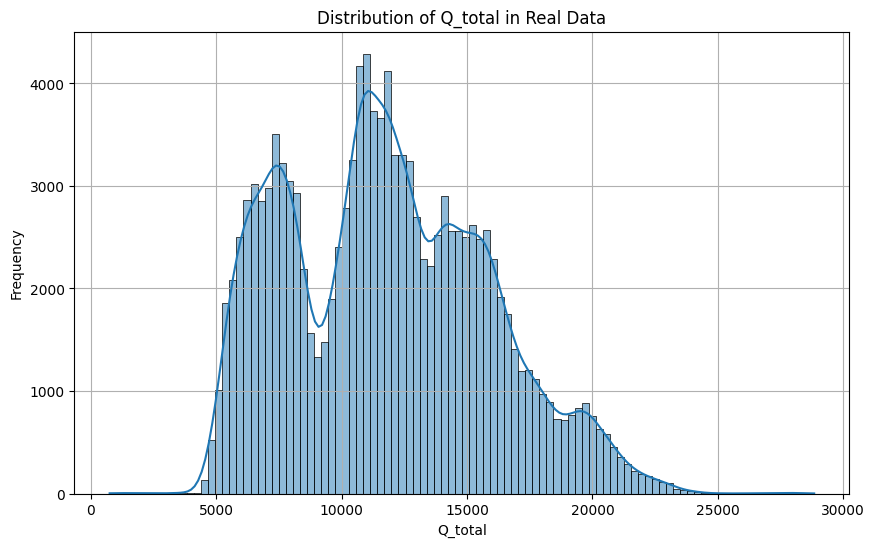

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(real_data['Q_total'], bins=100, kde=True)
plt.title('Distribution of Q_total in Real Data')
plt.xlabel('Q_total')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

**Reasoning**:
Analyze the histogram to identify potential ranges for Q_total that represent relatively constant heat transfer, and print these ranges for subsequent filtering. Based on the histogram, there appears to be a peak around 10000 and another around 18000. I will define approximate ranges around these peaks.



In [ ]:
# Based on the histogram, identify approximate ranges of high density
# Example ranges identified visually from the histogram:
q_total_ranges = [
    (9000, 12000),  # Range around the lower peak
    (16000, 20000) # Range around the higher peak
]

print("Identified Q_total ranges for analysis:")
for r in q_total_ranges:
    print(f"  {r[0]} to {r[1]}")

# These ranges will be used in the next subtask to filter the data.

Identified Q_total ranges for analysis:
  9000 to 12000
  16000 to 20000


## 过滤数据

### Subtask:
根据步骤 2 定义的 `Q_total` 范围，过滤真实数据和模拟数据，创建包含近似恒定 `Q_total` 的子集。


**Reasoning**:
Initialize the dictionaries and iterate through the defined Q_total ranges to filter both real and synthetic data, then print the counts for verification.



In [ ]:
# Initialize dictionaries to store filtered data
filtered_real_data_ranges = {}
filtered_synthetic_data_ranges = {}

# Iterate through the defined Q_total ranges
for min_q, max_q in q_total_ranges:
    range_key = f'{min_q}-{max_q}'

    # Filter real data
    filtered_real = real_data[(real_data['Q_total'] >= min_q) & (real_data['Q_total'] <= max_q)].copy()
    filtered_real_data_ranges[range_key] = filtered_real

    # Filter synthetic data
    filtered_synthetic = synthetic_data[(synthetic_data['Q_total'] >= min_q) & (synthetic_data['Q_total'] <= max_q)].copy()
    filtered_synthetic_data_ranges[range_key] = filtered_synthetic

# Print the number of rows in each filtered DataFrame
print("Number of rows in filtered dataframes for each Q_total range:")
for range_key in q_total_ranges:
    key = f'{range_key[0]}-{range_key[1]}'
    print(f"  Range {key}:")
    print(f"    Real Data: {len(filtered_real_data_ranges[key])} rows")
    print(f"    Synthetic Data: {len(filtered_synthetic_data_ranges[key])} rows")


Number of rows in filtered dataframes for each Q_total range:
  Range 9000-12000:
    Real Data: 32672 rows
    Synthetic Data: 9839 rows
  Range 16000-20000:
    Real Data: 16398 rows
    Synthetic Data: 6374 rows


## 分析子集中的关系

### Subtask:
在过滤后的真实数据和模拟数据子集中，分别探究 `flow_cow` 与 `temp_in - temp_out` 之间的相关关系。这可以通过绘制散点图和计算相关系数来完成。


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Iterate through the Q_total ranges
for range_key in filtered_real_data_ranges.keys():

    real_subset = filtered_real_data_ranges[range_key]
    synthetic_subset = filtered_synthetic_data_ranges[range_key]

    print(f"\nAnalyzing Q_total range: {range_key}")

    # Check if subsets are not empty before plotting and calculating correlation
    if not real_subset.empty:
        # Plot for real data
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=real_subset, x='temp_diff', y='flow_cow', alpha=0.6, s=10, color='skyblue')
        plt.title(f'Real Data: Flow Cow vs Temperature Difference ({range_key} Q_total)')
        plt.xlabel('Temperature Difference (°C)')
        plt.ylabel('Flow Cow')
        plt.grid(True)
        plt.xlim(0, 12) # Set x-axis limit
        plt.show()

        # Calculate and print correlation for real data
        real_corr = real_subset['flow_cow'].corr(real_subset['temp_diff'])
        print(f"  Correlation for Real Data ({range_key}): {real_corr:.4f}")
    else:
        print(f"  No real data in Q_total range: {range_key}")


    if not synthetic_subset.empty:
        # Plot for synthetic data
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=synthetic_subset, x='temp_diff', y='flow_cow', alpha=0.6, s=10, color='lightcoral')
        plt.title(f'Synthetic Data: Flow Cow vs Temperature Difference ({range_key} Q_total)')
        plt.xlabel('Temperature Difference (°C)')
        plt.ylabel('Flow Cow')
        plt.grid(True)
        plt.xlim(0, 12) # Set x-axis limit
        plt.show()

        # Calculate and print correlation for synthetic data
        synth_corr = synthetic_subset['flow_cow'].corr(synthetic_subset['temp_diff'])
        print(f"  Correlation for Synthetic Data ({range_key}): {synth_corr:.4f}")
    else:
        print(f"  No synthetic data in Q_total range: {range_key}")

NameError: name 'filtered_real_data_ranges' is not defined

In [ ]:
import numpy as np

flow_f = filtered_data['flow_cow']
m = np.mean(flow_f)
temp = filtered_data[
    abs(filtered_data['flow_cow'] - m) < 0.1
]
print(len(temp))
print(temp)

7
         temp_in   temp_out  freq_fan_1  freq_fan_2  freq_fan_3    flow_cow  \
3955   32.589766  29.567020   49.180215   49.706963   49.497937  955.992843   
13317  31.284019  28.373459   49.204811   49.729880   49.473869  956.001181   
15003  30.477879  28.412573   49.195838   49.716930   49.495028  955.935091   
19855  30.688504  28.082998   49.234016   49.709723   49.475467  956.016444   
33619  30.283014  27.941375   49.235383   49.709405   49.452342  955.924000   
35296  30.723527  27.665444   49.257530   49.698011   49.525539  956.019139   
48499  31.366141  28.670440   49.270122   49.700105   49.527252  955.983025   

       temp_dry_bulb  ratio_humidity  constraints_pass  \
3955       32.215524       57.882552              True   
13317      31.753786       60.332453              True   
15003      31.472864       59.879290              True   
19855      30.010603       85.077105              True   
33619      33.097801       65.366805              True   
35296      31.905